This document provides a suggested outline for the notebook used for the data challenge. Please make sure you run this notebook before you made a submission, so that you have the code and results.

## Problem definition and task allocations.

In this section, please describe briefly:
- the problems in this project.
- how do you attribute the tasks to the team members.

You can use this Table to allocate the tasks:

| Member | Task | 
| --- | --- |
| Liu Ya | all |
| Zhou Long | all |

the best outcome of both


The problem in this project is to develop a model to detect the failures from the data collected from the sensors


In [252]:
utility_path = '../'
import sys
sys.path.insert(1, utility_path)

from utility import read_all_test_data_from_path
import numpy as np 
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
import warnings
%matplotlib inline

# Subfunction for data preprocessing.
def pre_processing(df: pd.DataFrame):
    ''' ### Description
    Preprocess the data:
    - remove outliers
    - add new features about the difference between the current and previous n data point.
    '''
    
    def remove_outliers(df: pd.DataFrame):
        ''' # Description
        Remove outliers from the dataframe based on defined valid ranges. 
        Define a valid range of temperature and voltage. 
        Use ffil function to replace the invalid measurement with the previous value.
        '''
        df['temperature'] = df['temperature'].where(df['temperature'] <= 100, np.nan)
        df['temperature'] = df['temperature'].where(df['temperature'] >= 0, np.nan)
        df['temperature'] = df['temperature'].ffill()        

        df['voltage'] = df['voltage'].where(df['voltage'] >= 6000, np.nan)
        df['voltage'] = df['voltage'].where(df['voltage'] <= 9000, np.nan)
        df['voltage'] = df['voltage'].ffill()        

        df['position'] = df['position'].where(df['position'] >= 0, np.nan)
        df['position'] = df['position'].where(df['position'] <= 1000, np.nan)
        df['position'] = df['position'].ffill()


    def remove_seq_variability(df: pd.DataFrame):
        ''' # Description
        Remove the sequence-to-sequence variability.
        '''
        # Tranform the features relative to the first data point.
        df['temperature'] = df['temperature'] - df['temperature'].iloc[0]
        df['voltage'] = df['voltage'] - df['voltage'].iloc[0]
        df['position'] = df['position'] - df['position'].iloc[0]
        
    # Start processing.
    remove_outliers(df)
    remove_seq_variability(df)

In [253]:
from sklearn.svm import SVC

20240105_164214: 0    Not moving
Name: Description, dtype: object



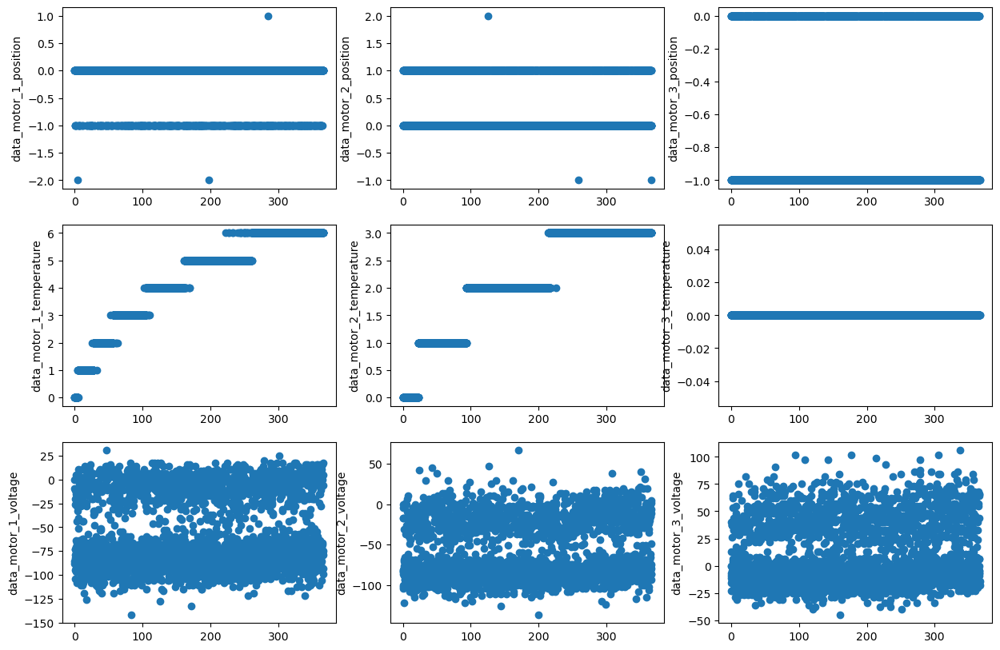

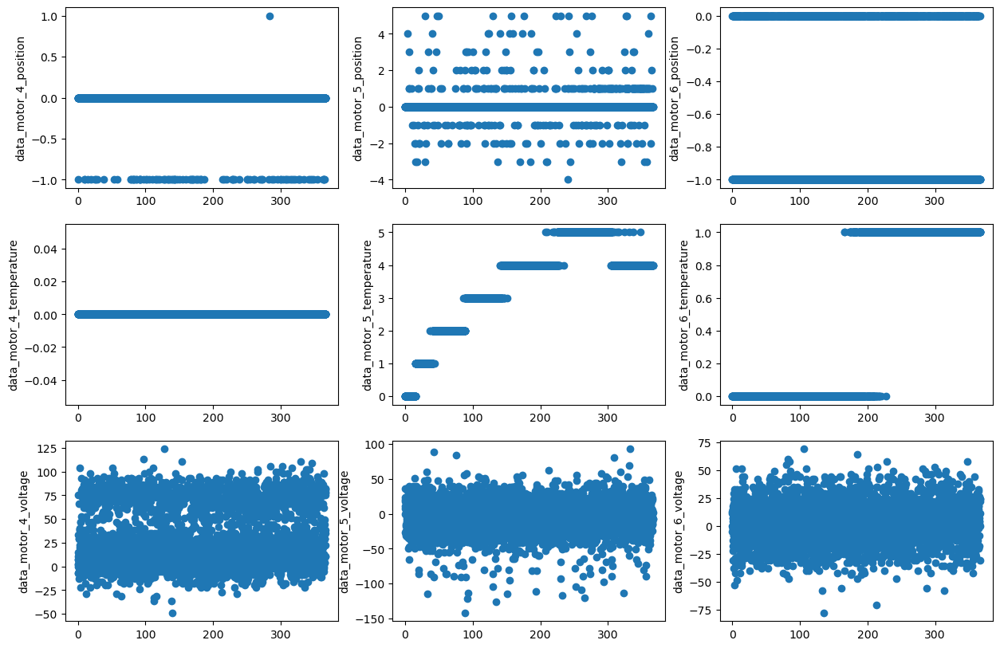

20240105_165300: 1    Pick up and place
Name: Description, dtype: object



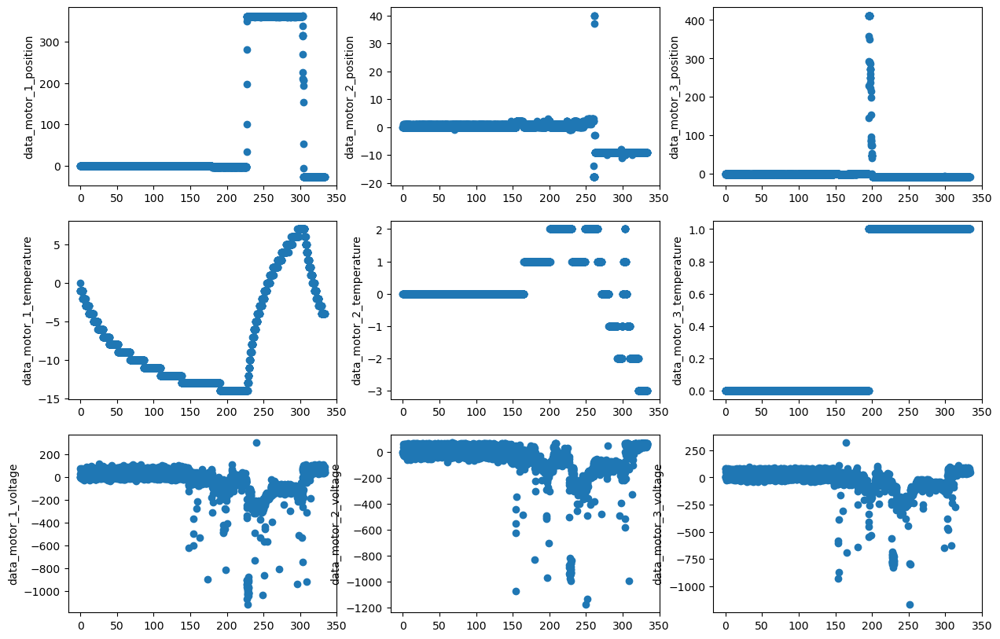

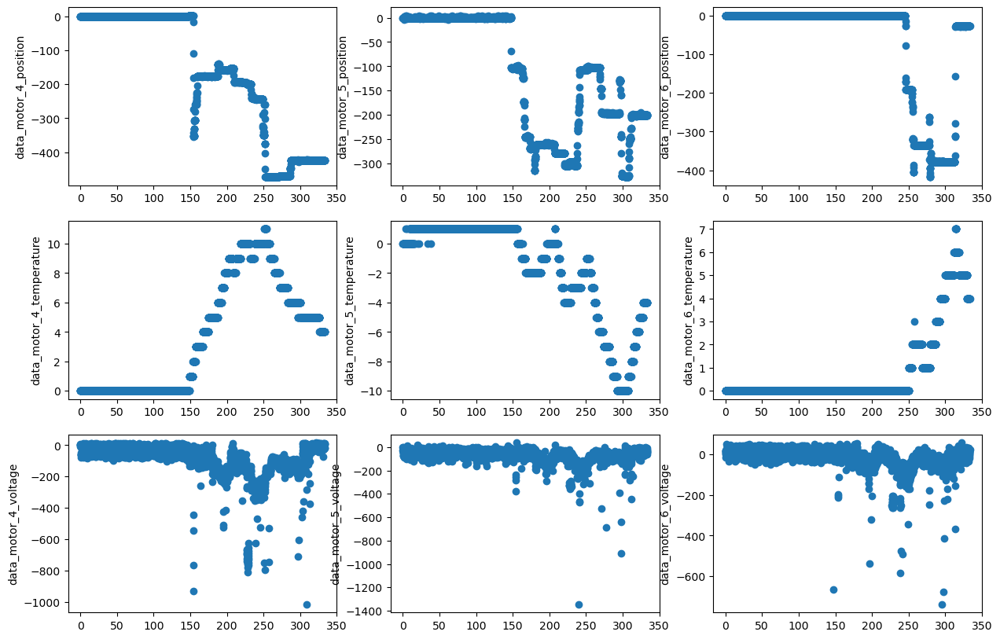

20240105_165972: 2    Not moving
Name: Description, dtype: object



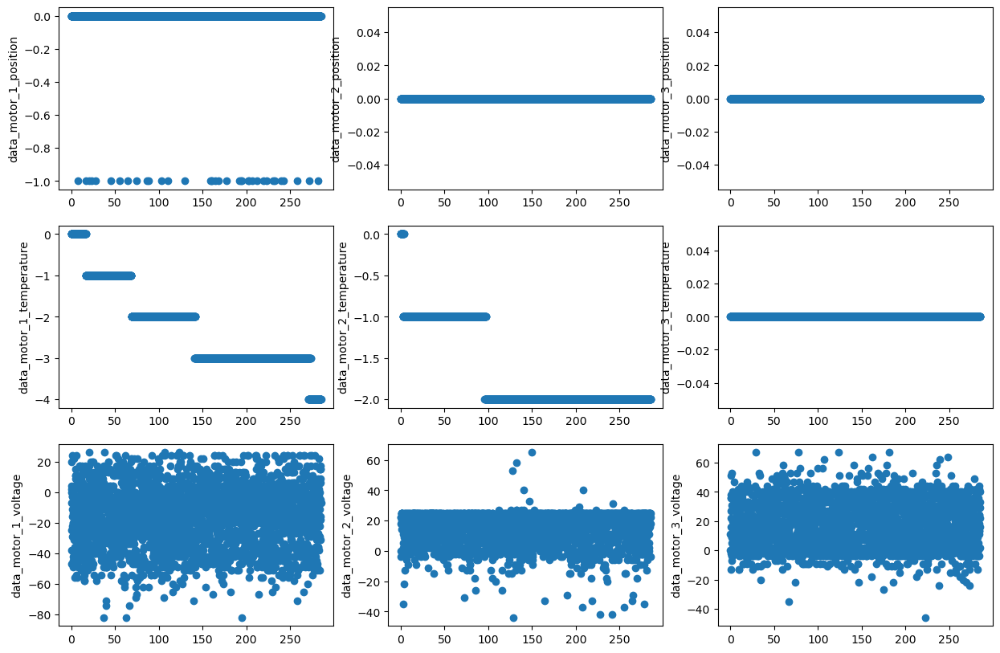

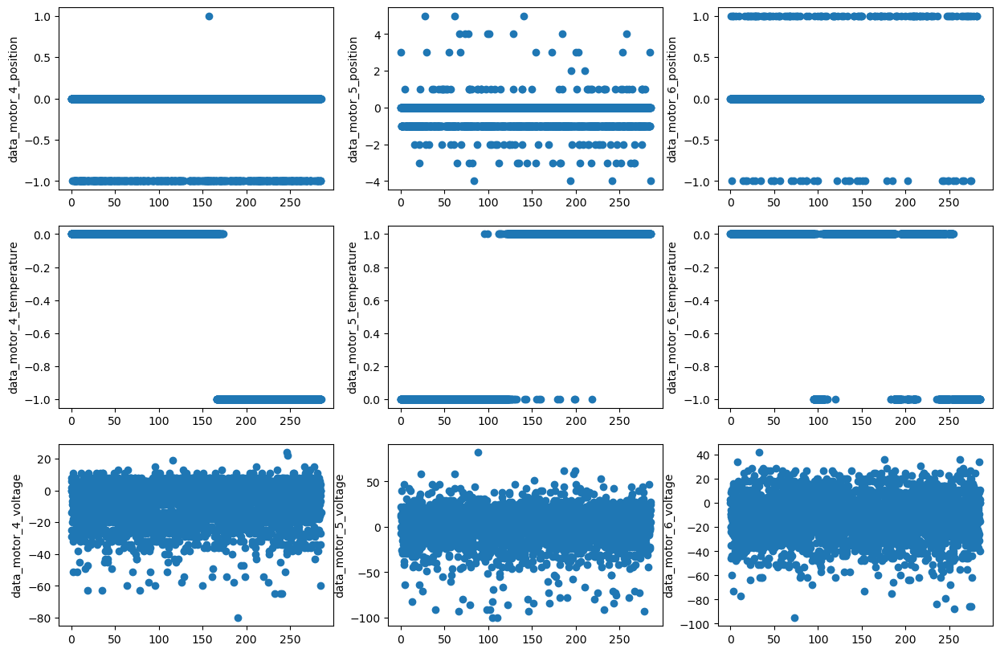

20240320_152031: 3    Not moving
Name: Description, dtype: object



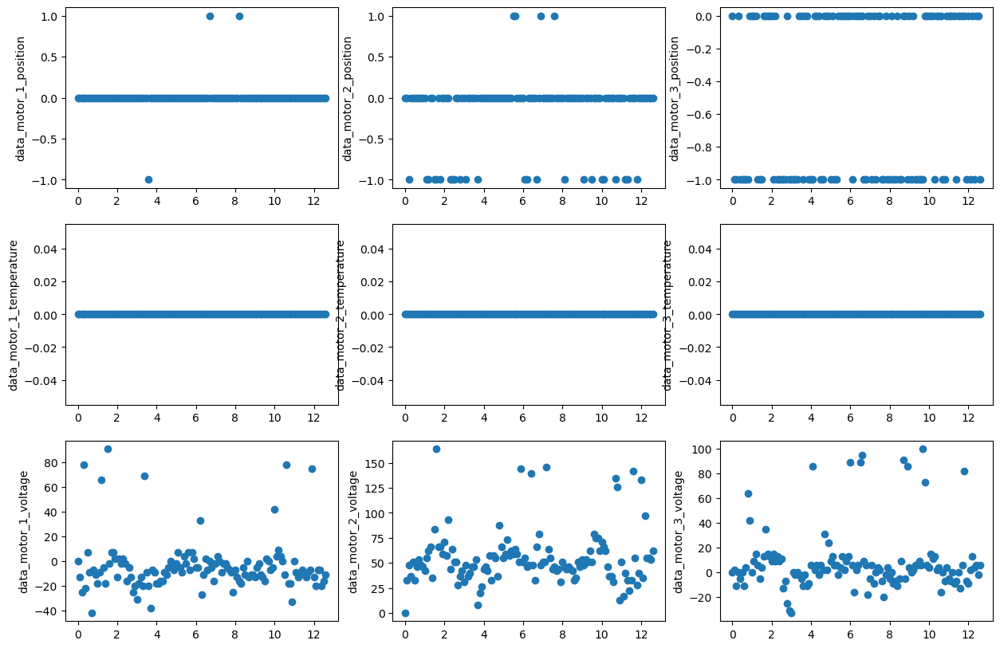

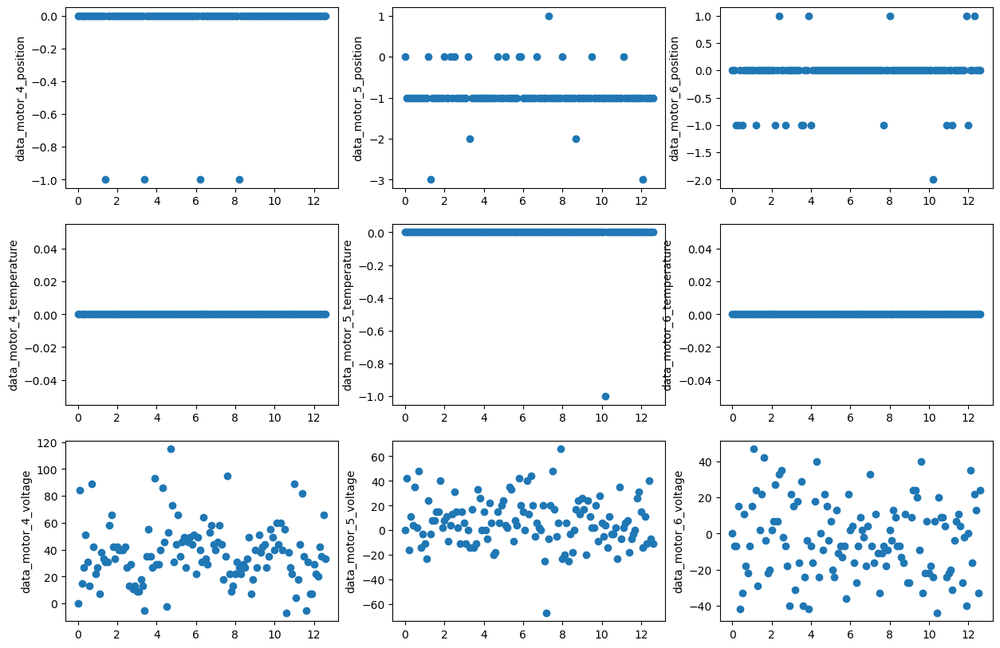

20240320_153841: 4    Move motor 6 -> motor 1 sequentially.
Name: Description, dtype: object



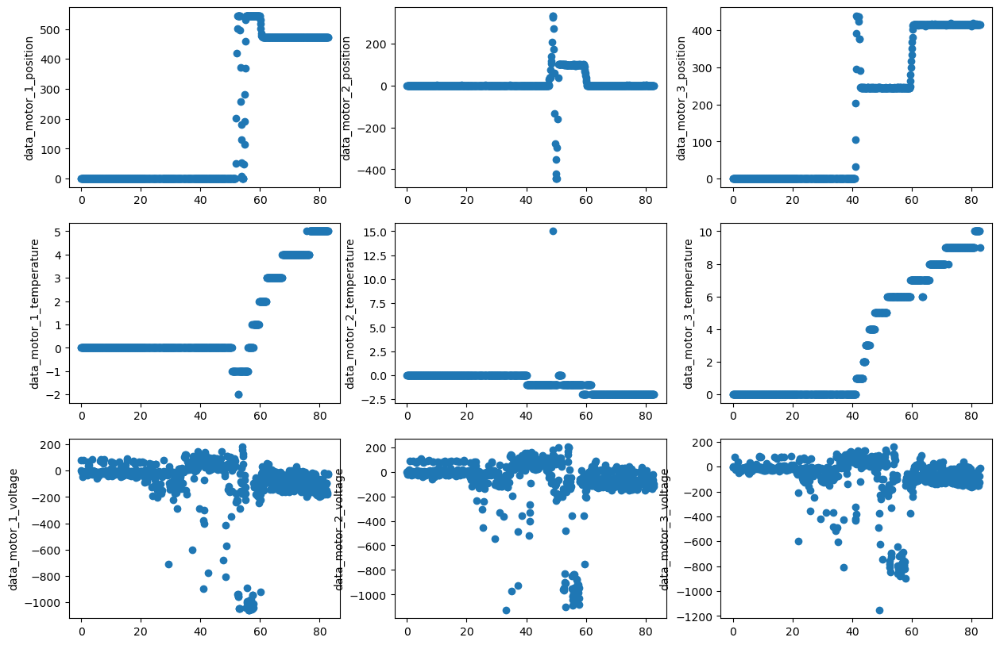

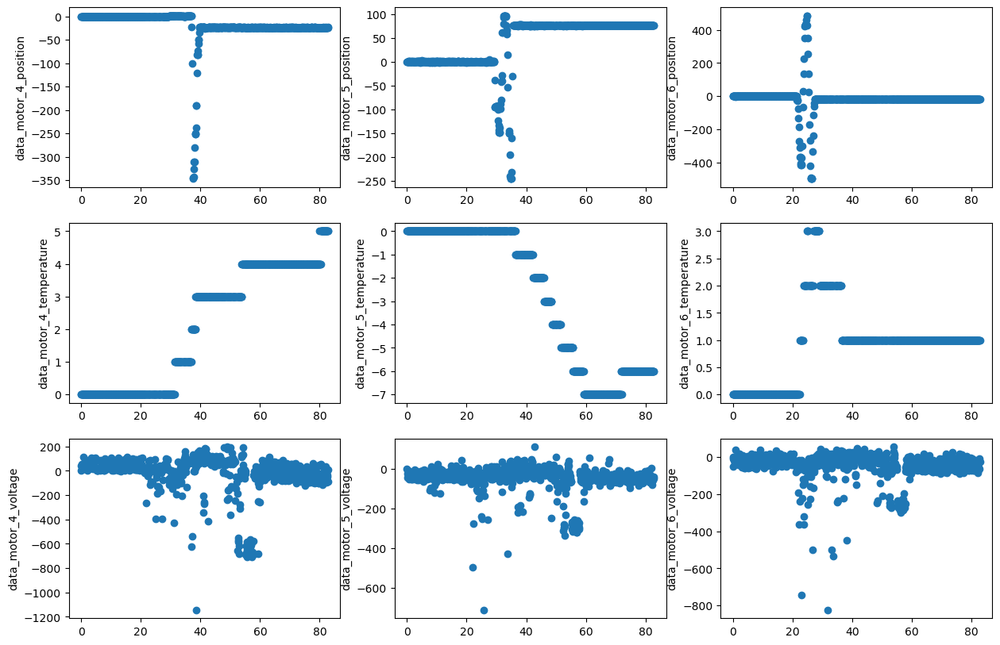

20240320_155664: 5    Not moving
Name: Description, dtype: object



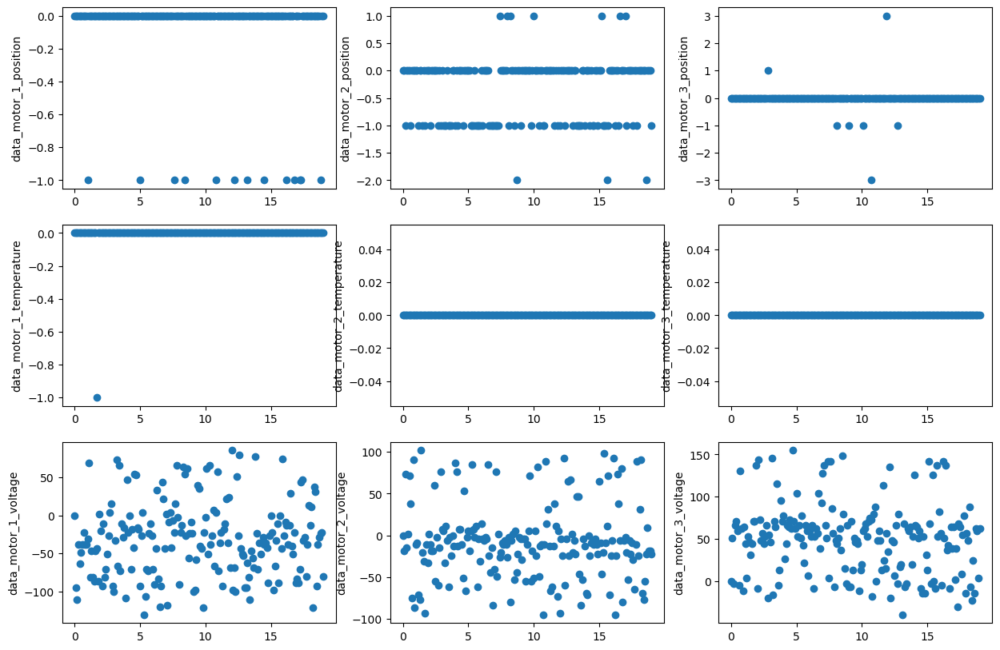

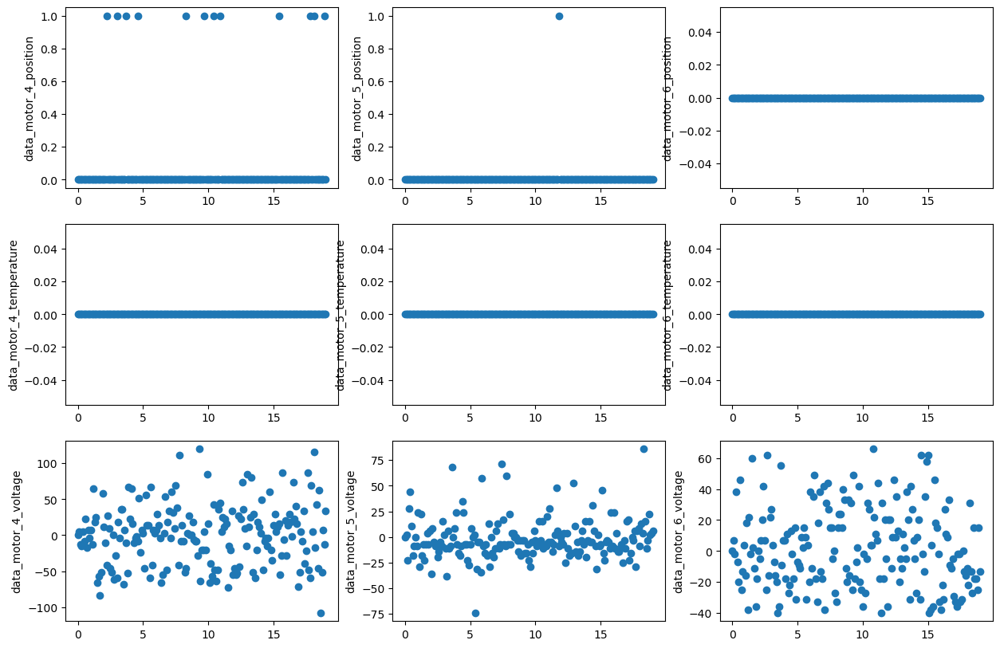

20240321_122650: 6    Pick up and place
Name: Description, dtype: object



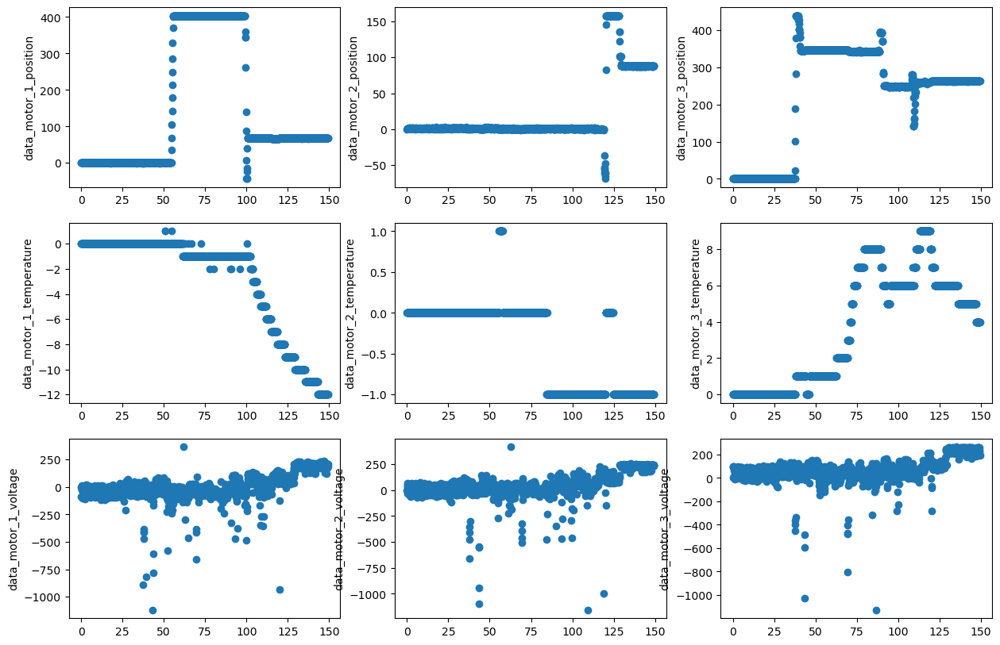

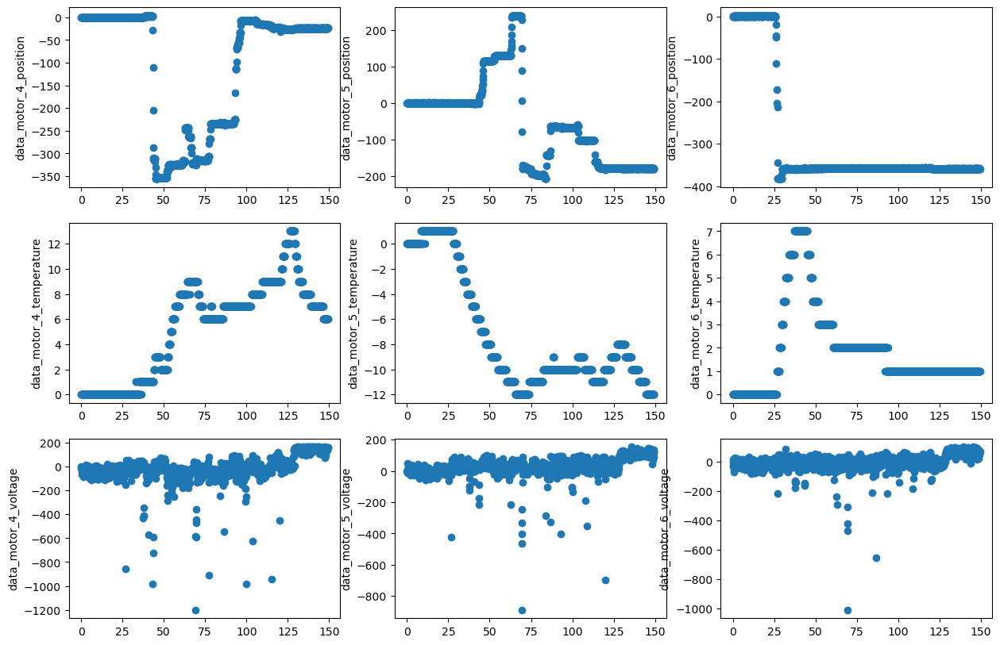

20240325_135213: 7    Not moving
Name: Description, dtype: object



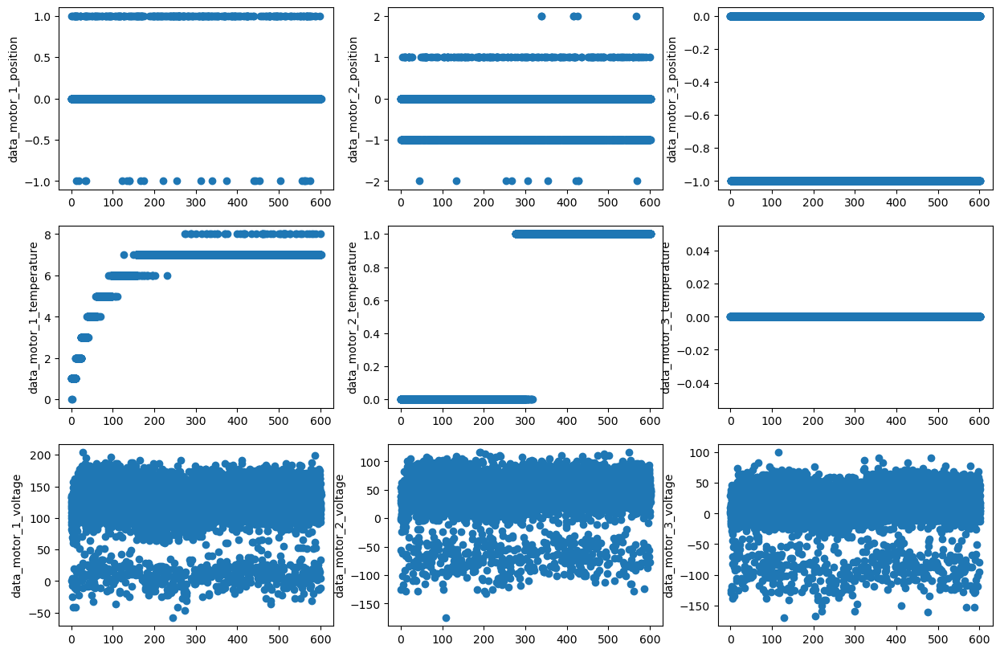

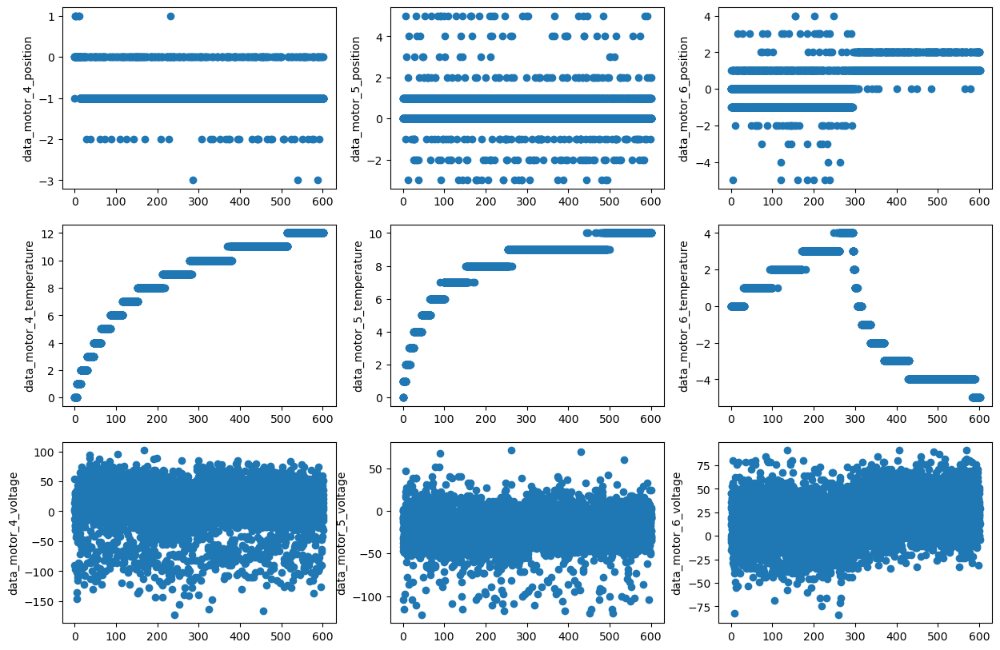

20240325_152902: 8    Pick up and place
Name: Description, dtype: object



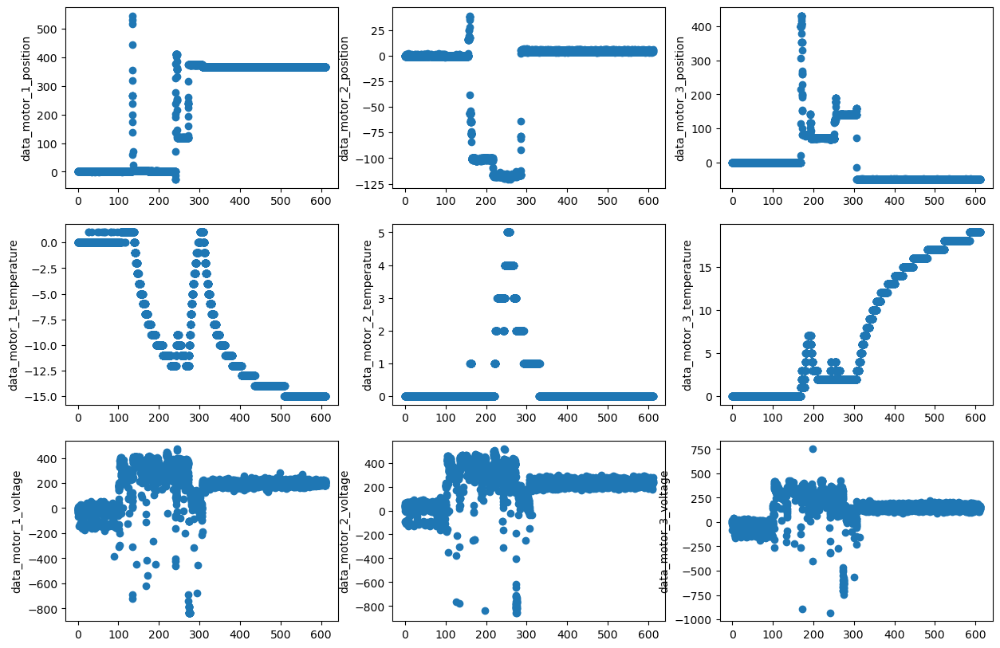

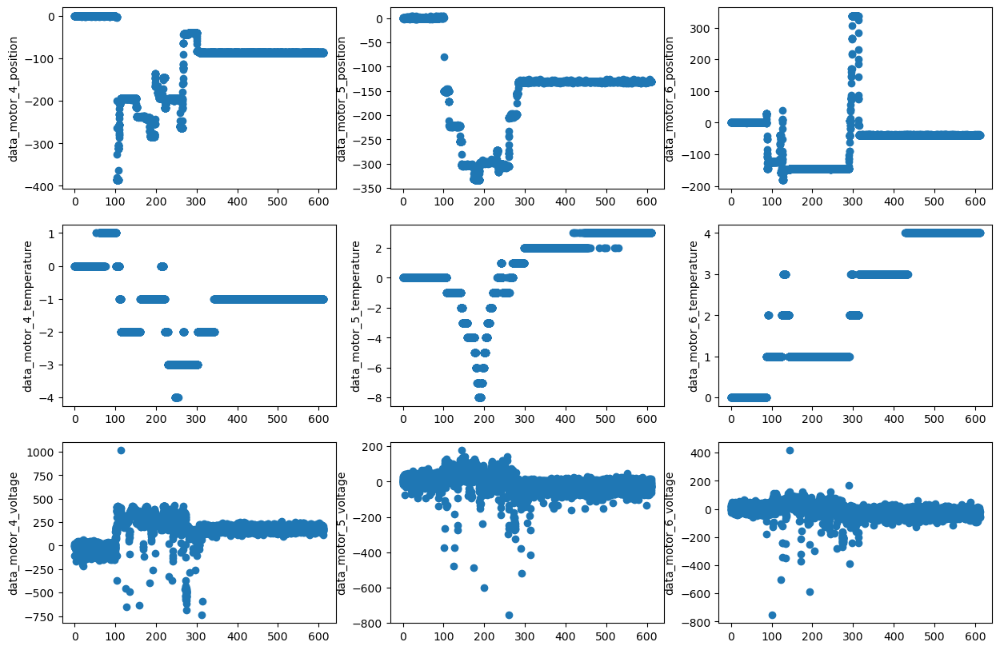

20240325_155003: 9    Pick up and place
Name: Description, dtype: object



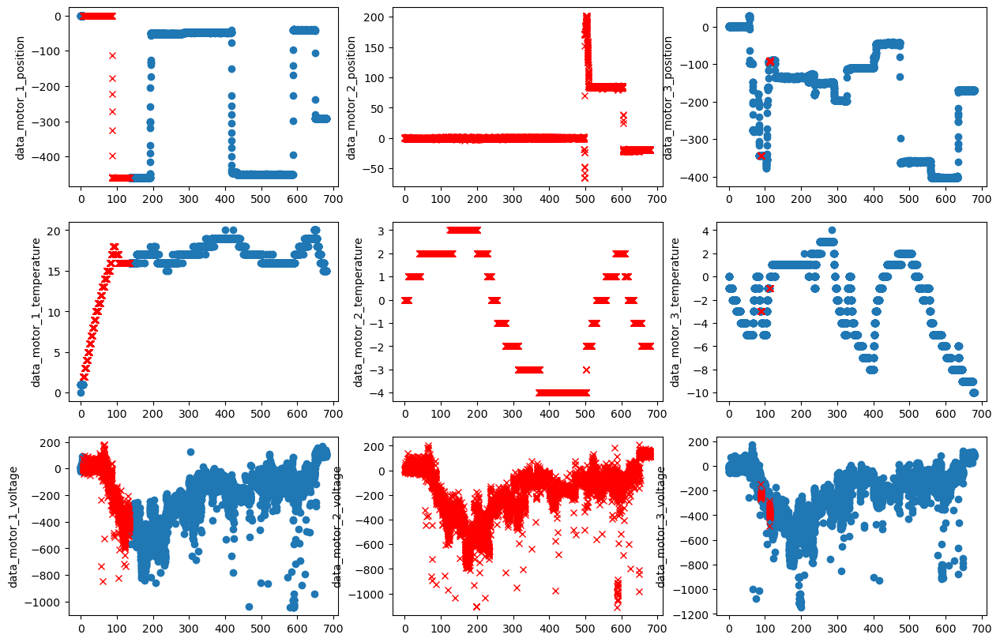

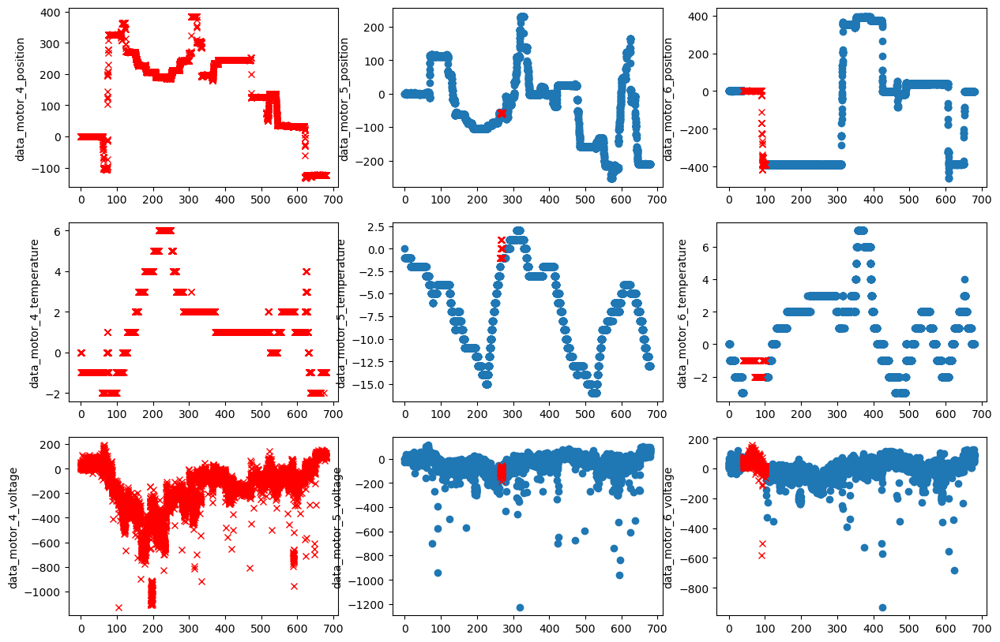

20240425_093699: 10    Not moving
Name: Description, dtype: object



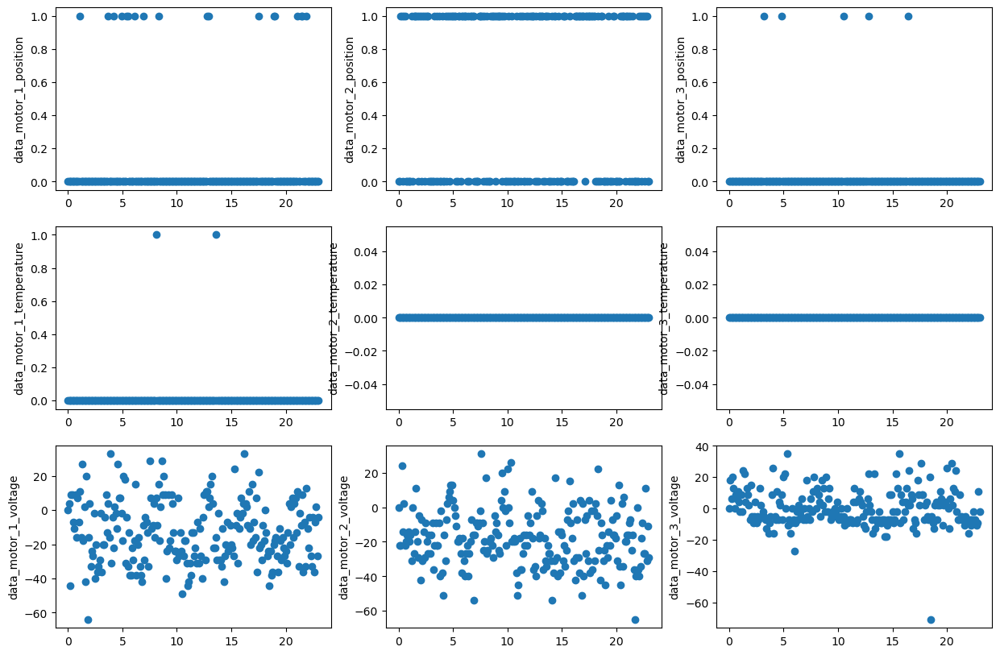

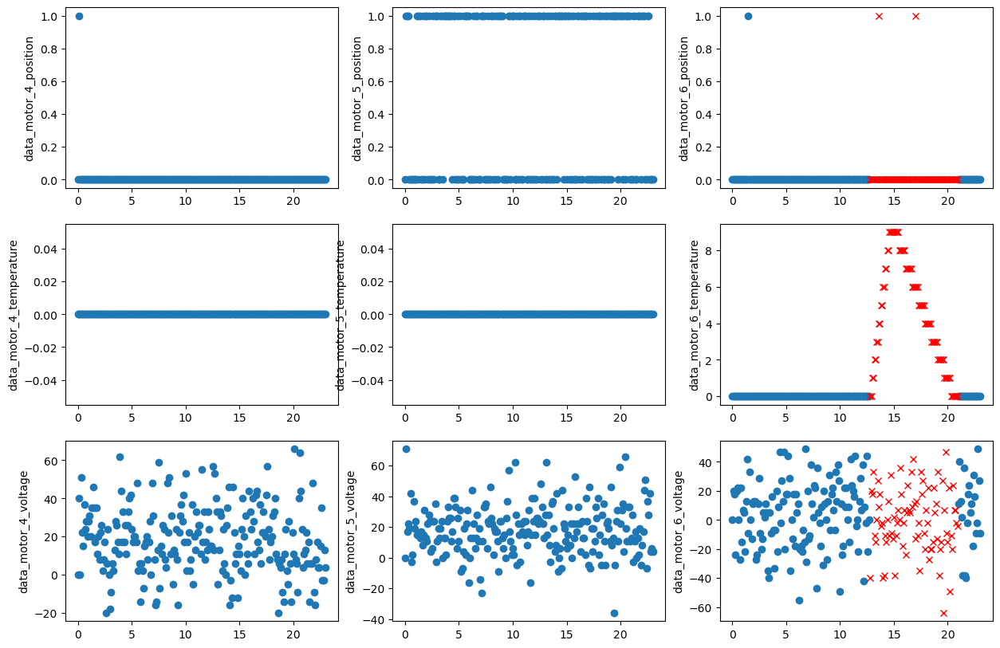

20240425_094425: 11    Not moving
Name: Description, dtype: object



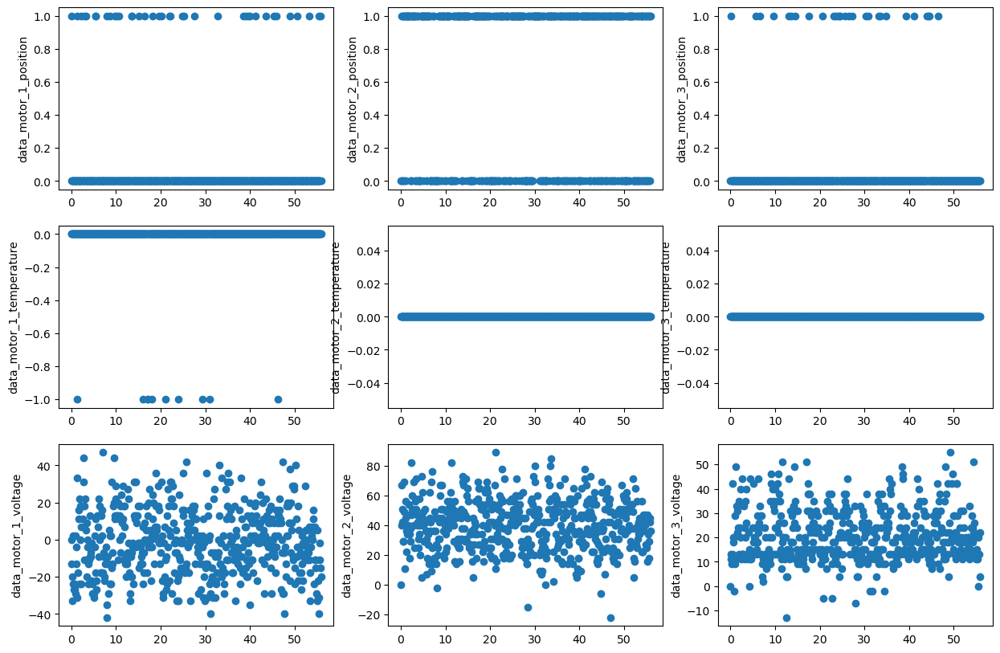

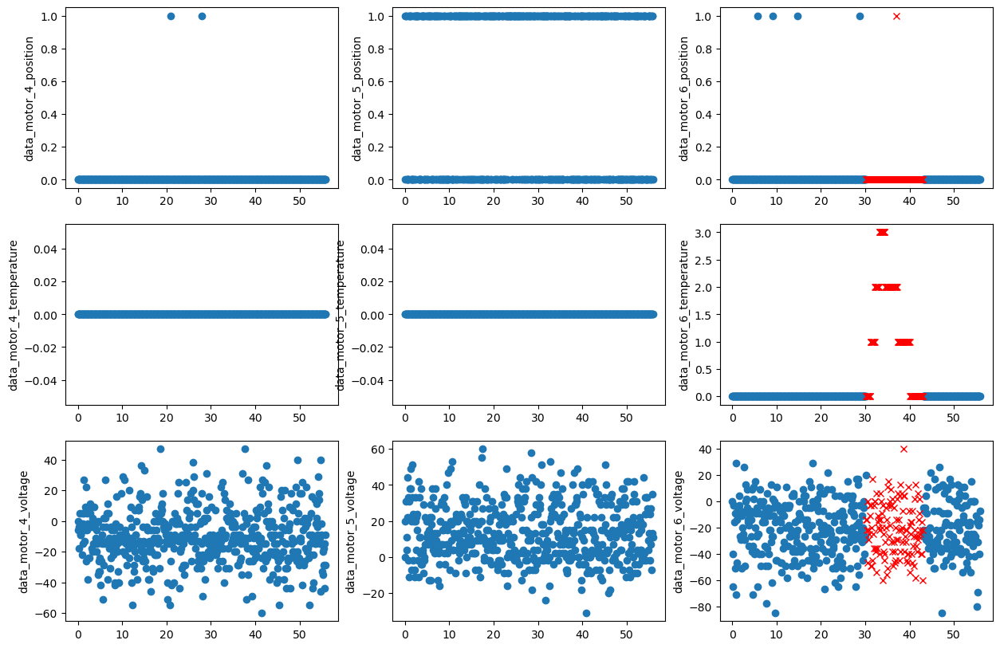

20240426_140055: 12    Not moving
Name: Description, dtype: object



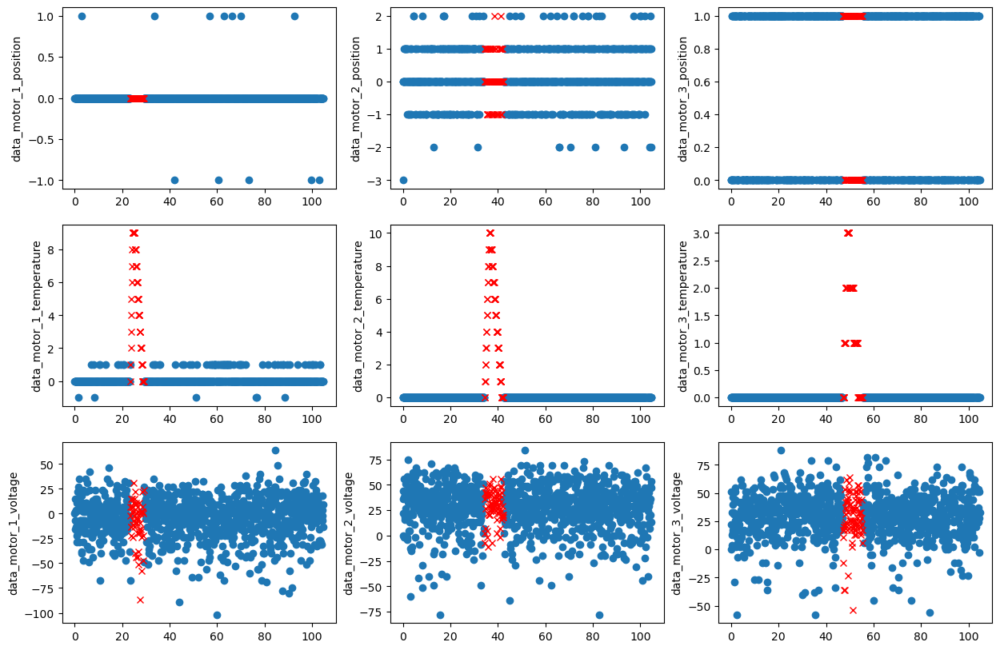

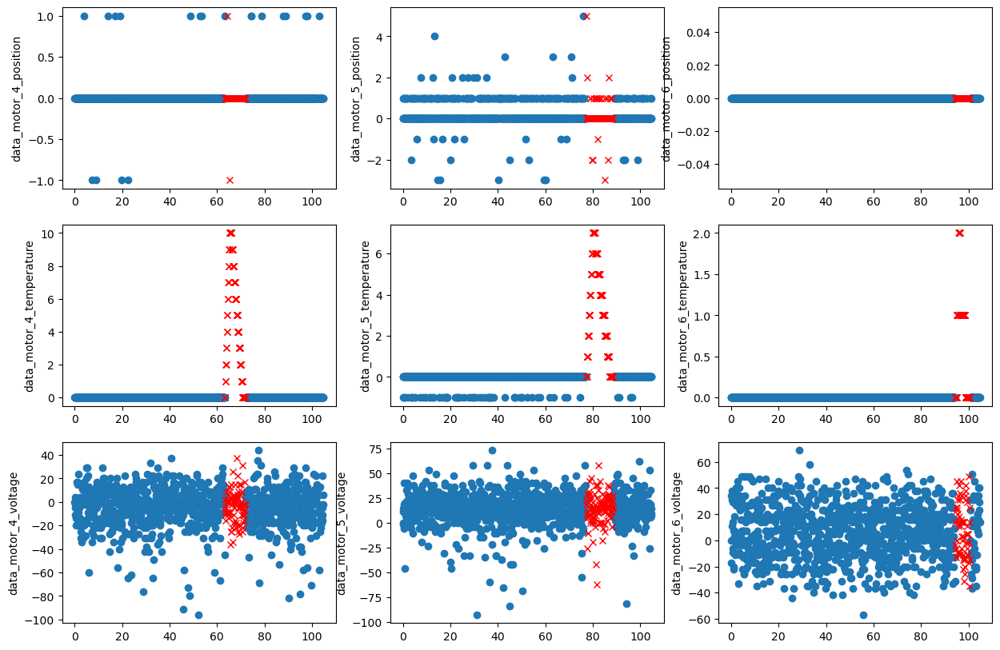

20240426_141190: 13    Pick up and place
Name: Description, dtype: object



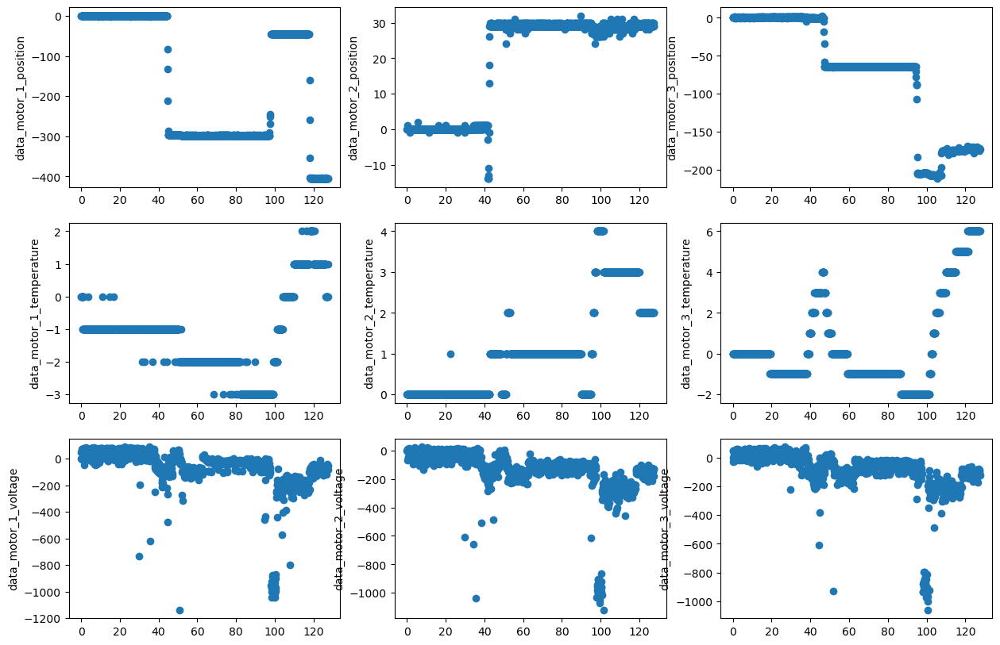

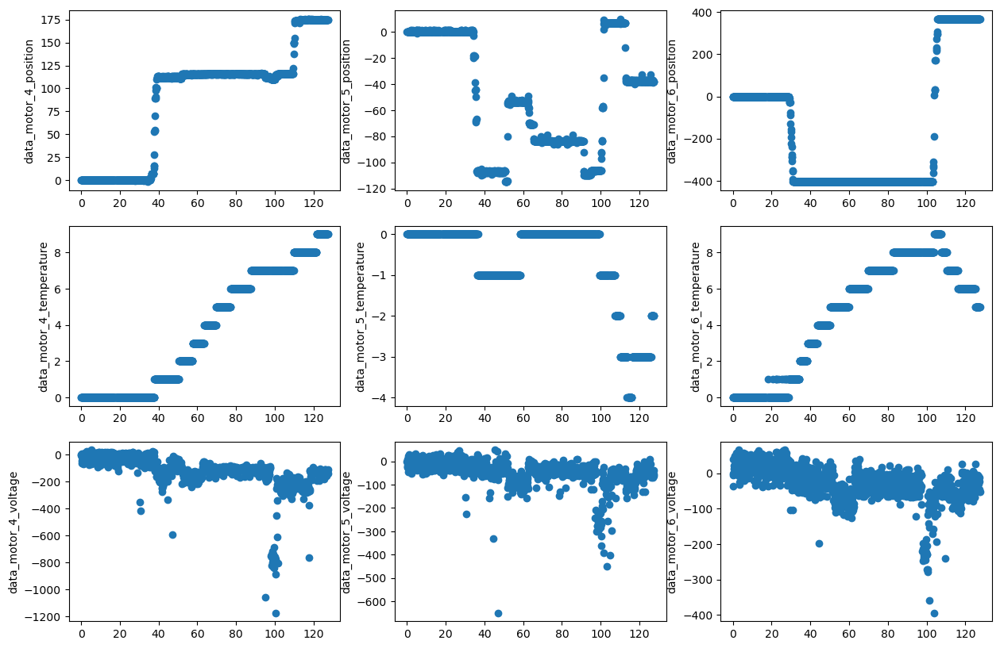

20240426_141532: 14    Moving one motor
Name: Description, dtype: object



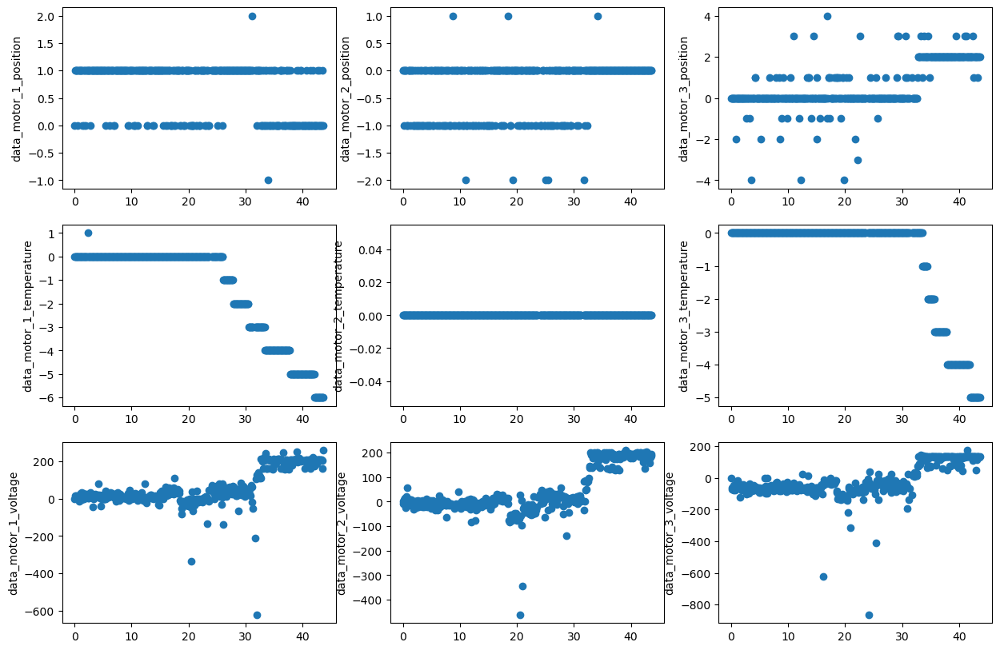

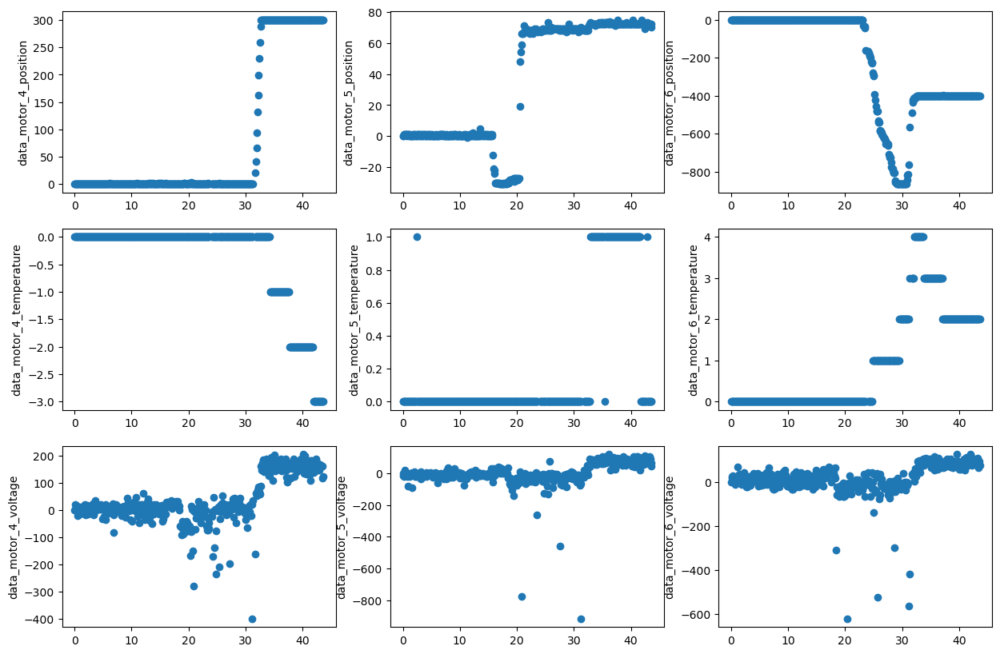

20240426_141602: 15    Moving one motor
Name: Description, dtype: object



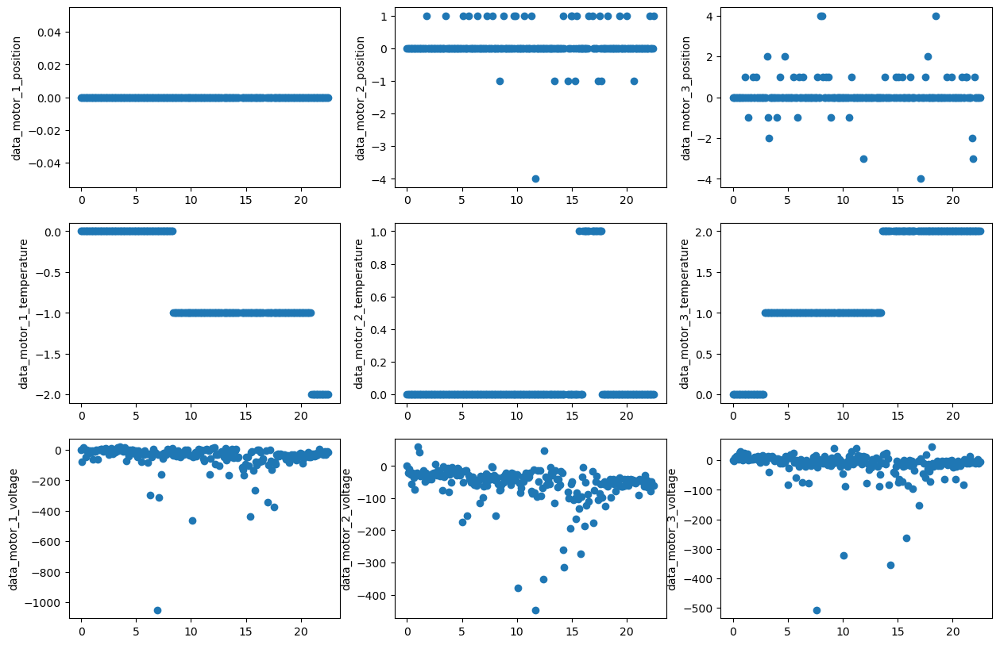

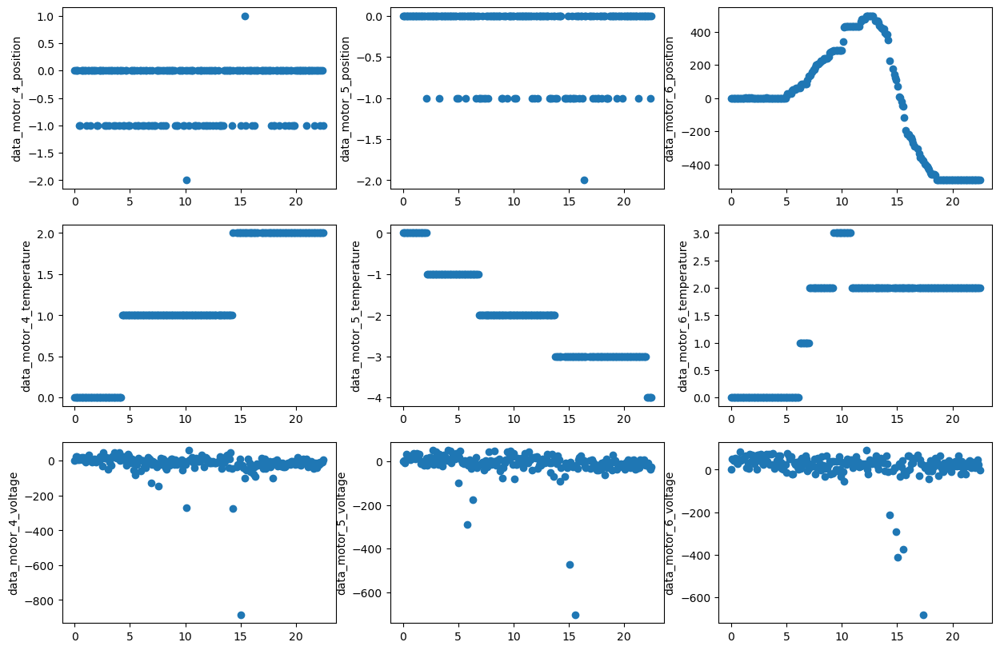

20240426_141726: 16    Moving one motor
Name: Description, dtype: object



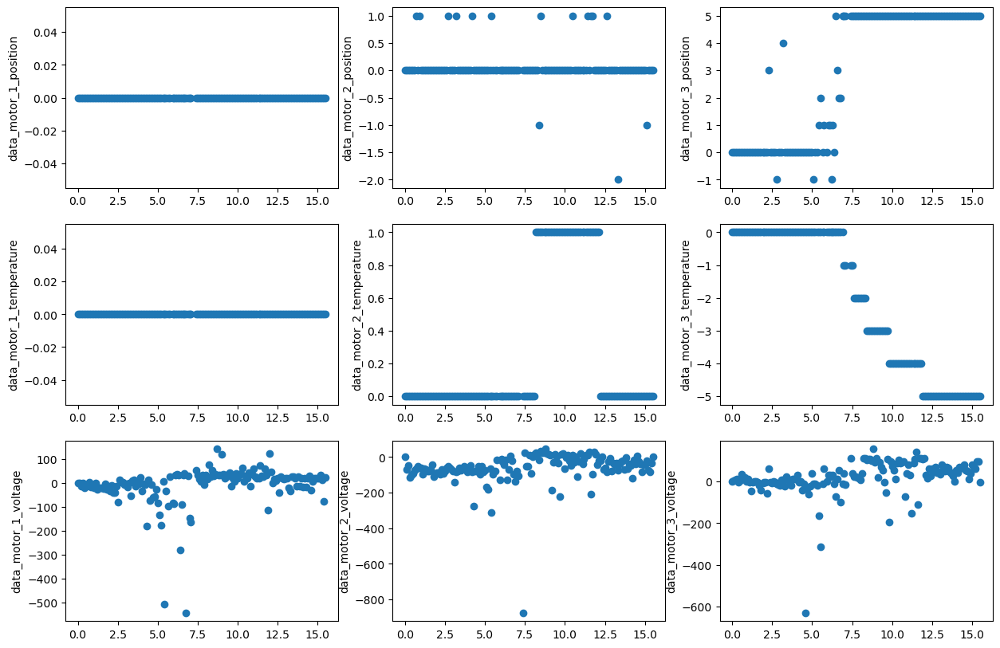

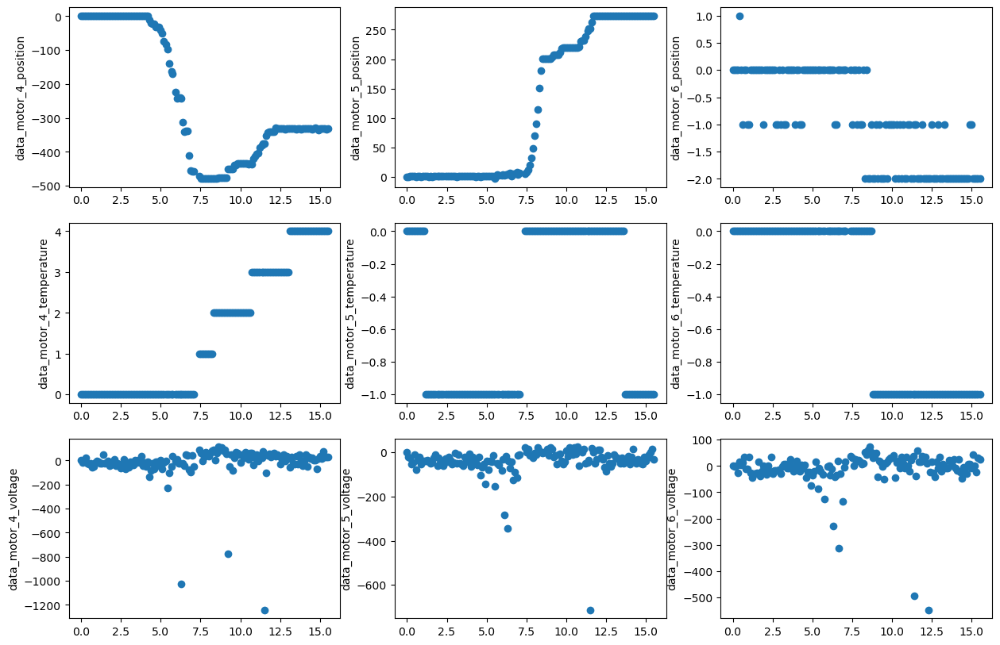

20240426_141938: 17    Moving one motor
Name: Description, dtype: object



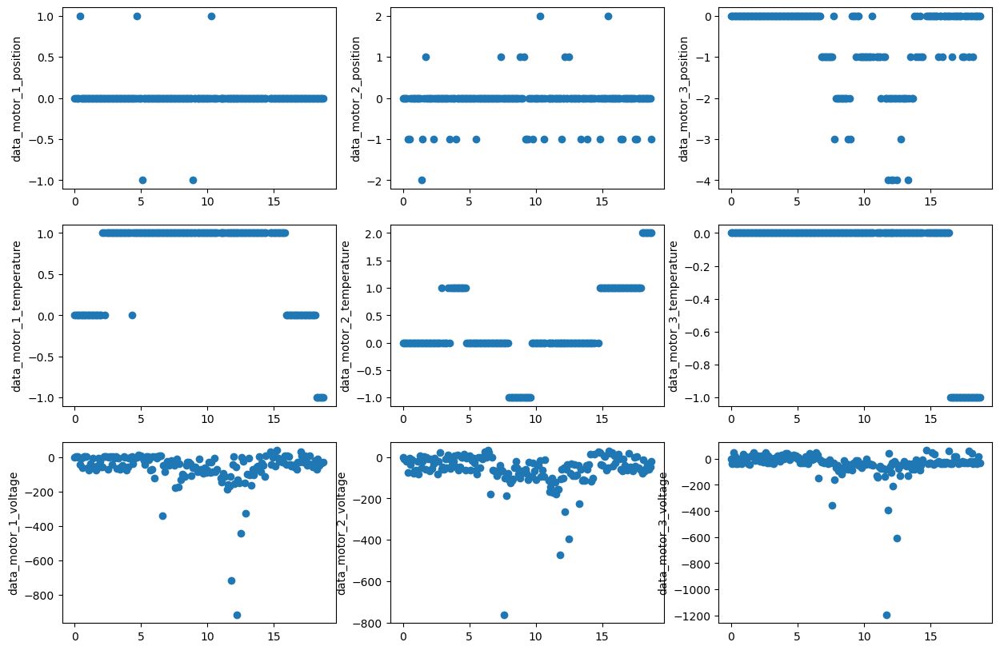

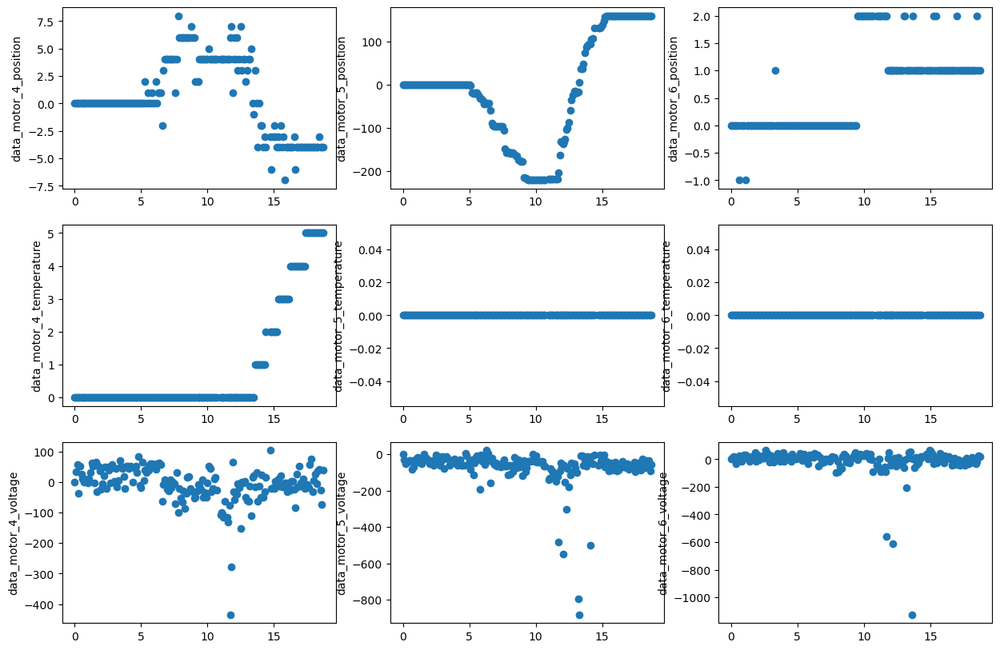

20240426_141980: 18    Moving one motor
Name: Description, dtype: object



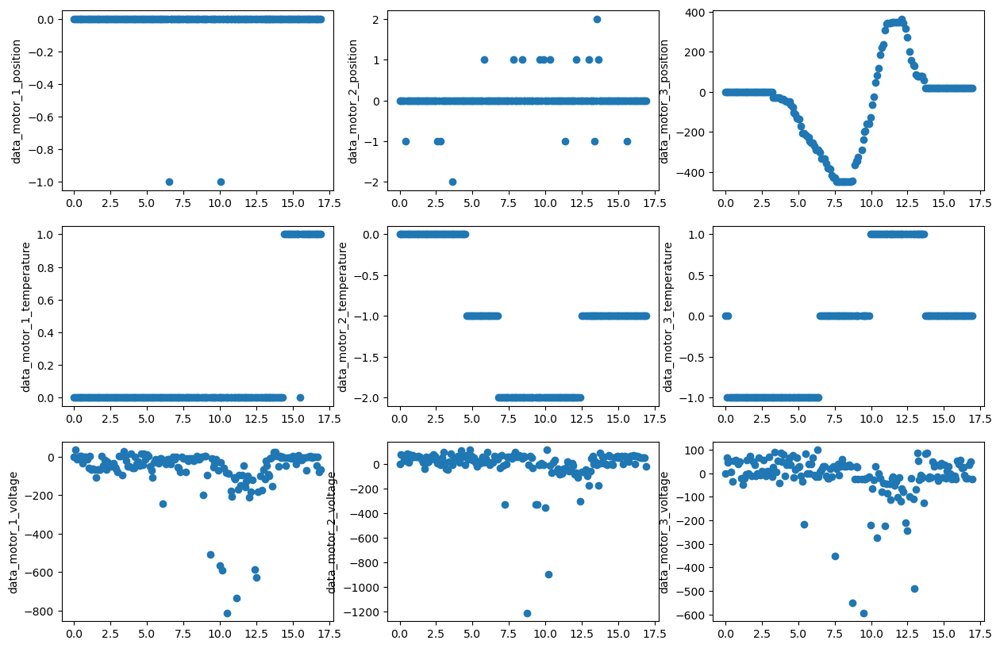

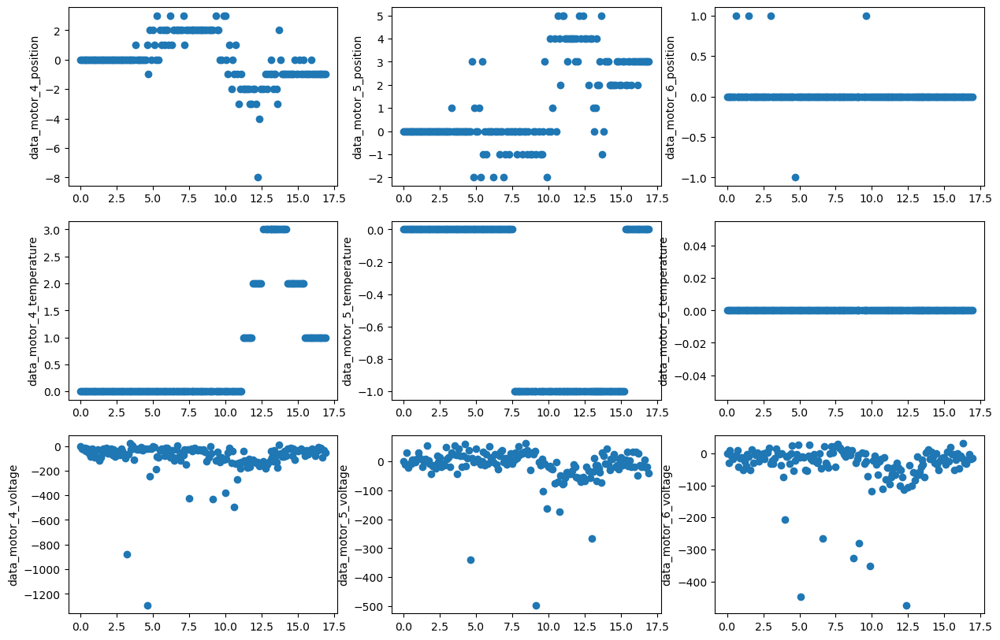

20240503_163963: 19    Pick up and place
Name: Description, dtype: object



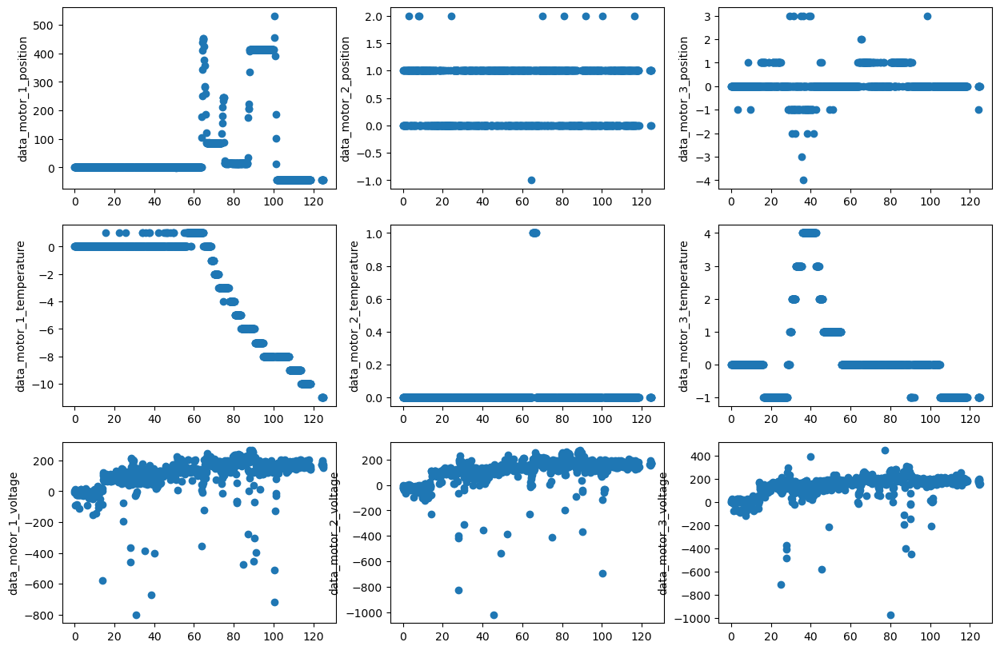

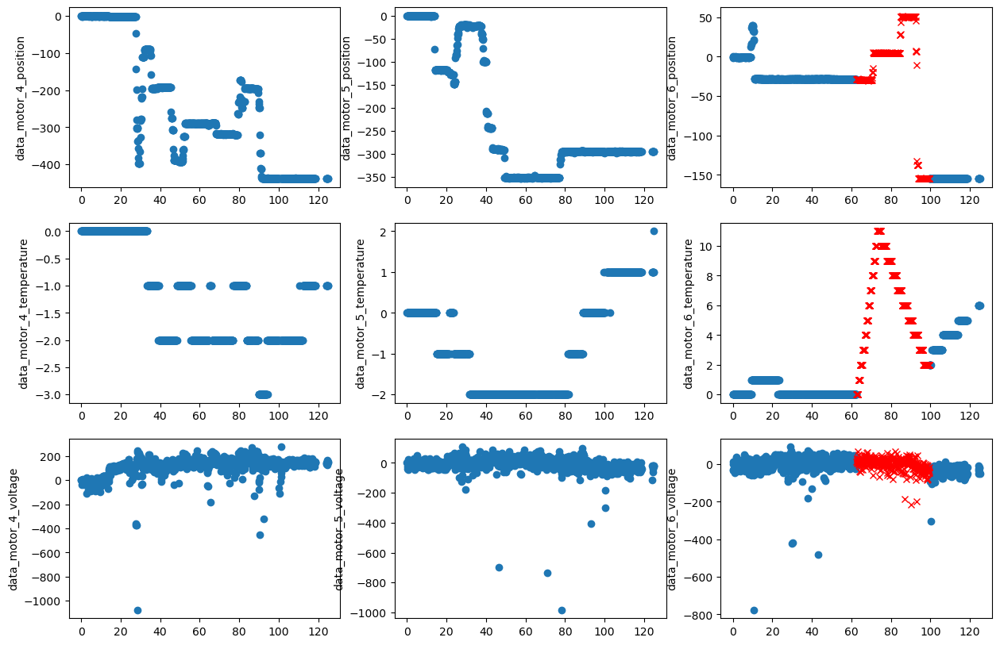

20240503_164435: 20    Turning motor 6
Name: Description, dtype: object



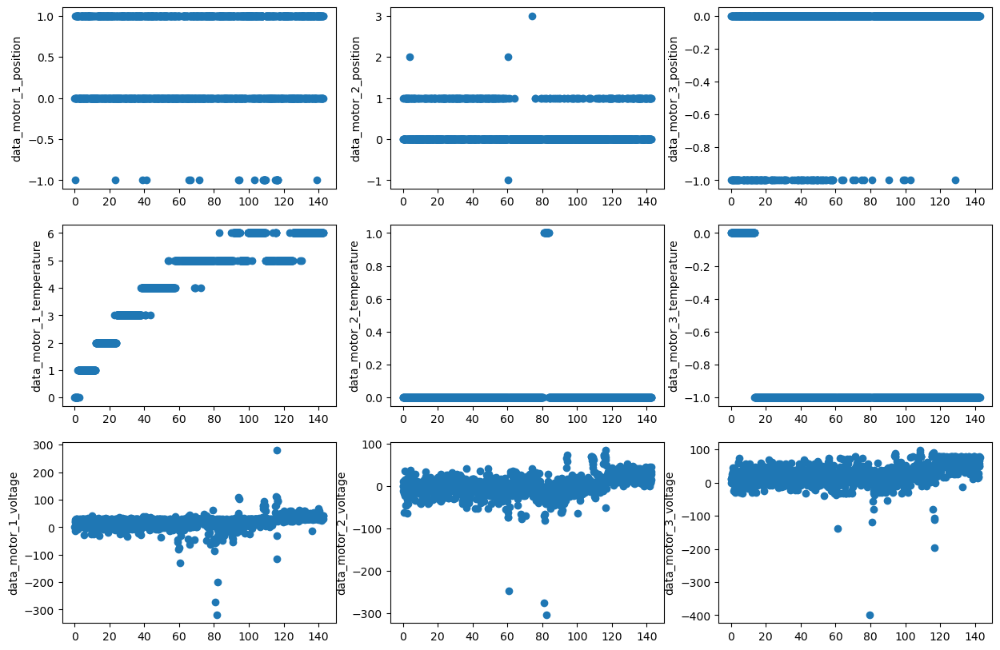

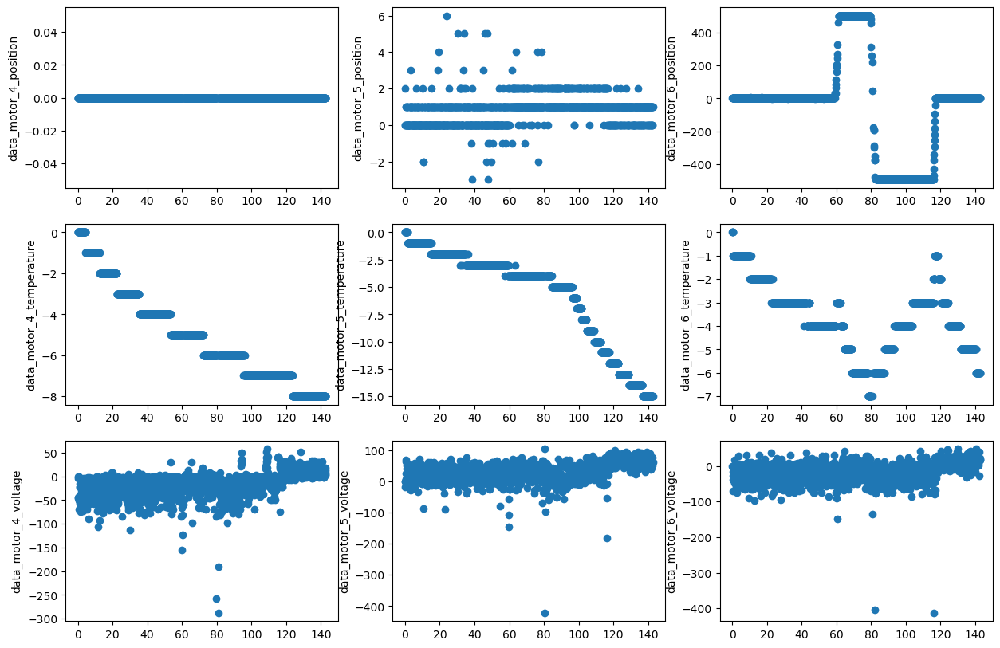

20240503_164675: 21    Turning motor 6
Name: Description, dtype: object



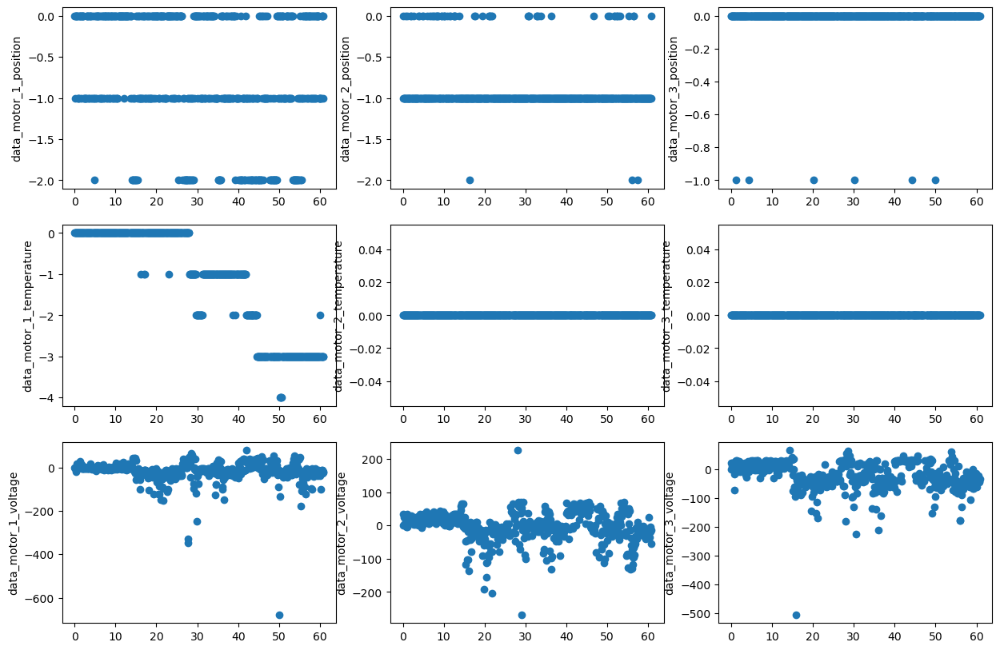

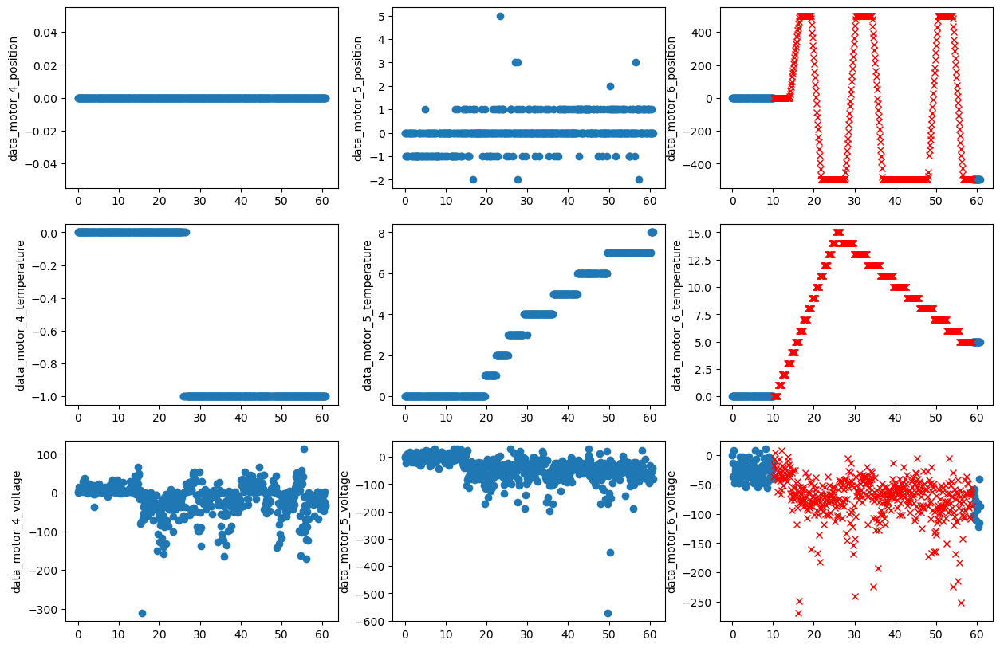

20240503_165189: 22    Turning motor 6
Name: Description, dtype: object



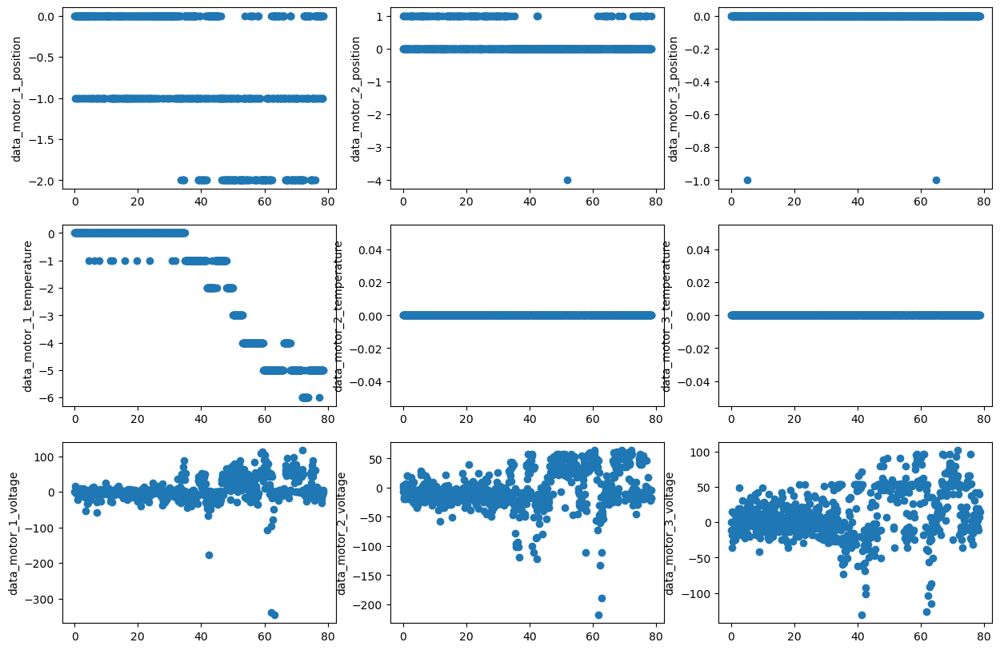

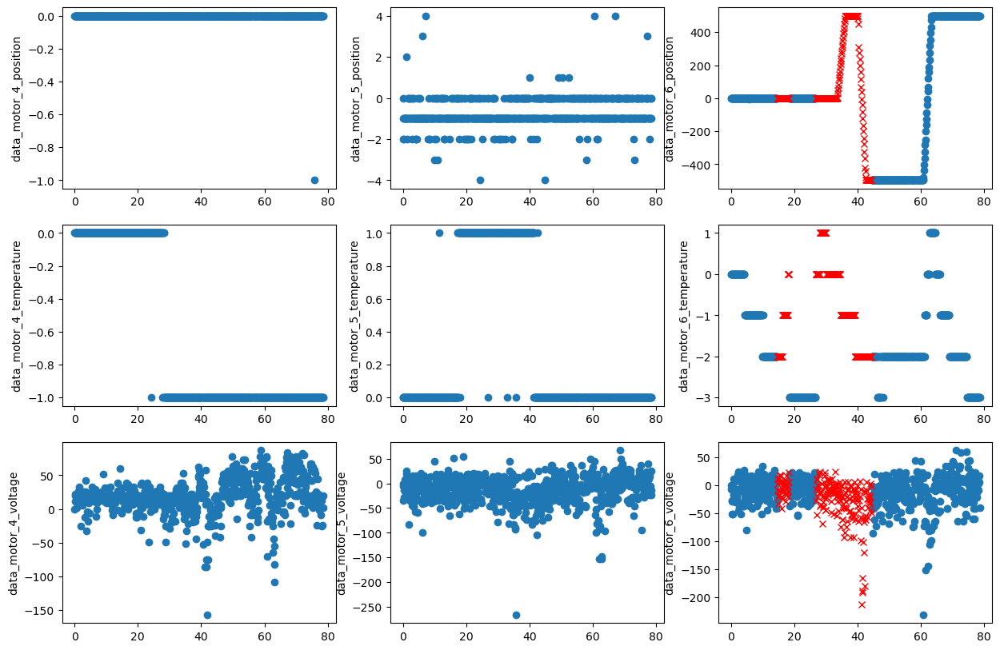

20240604_101954: Series([], Name: Description, dtype: object)



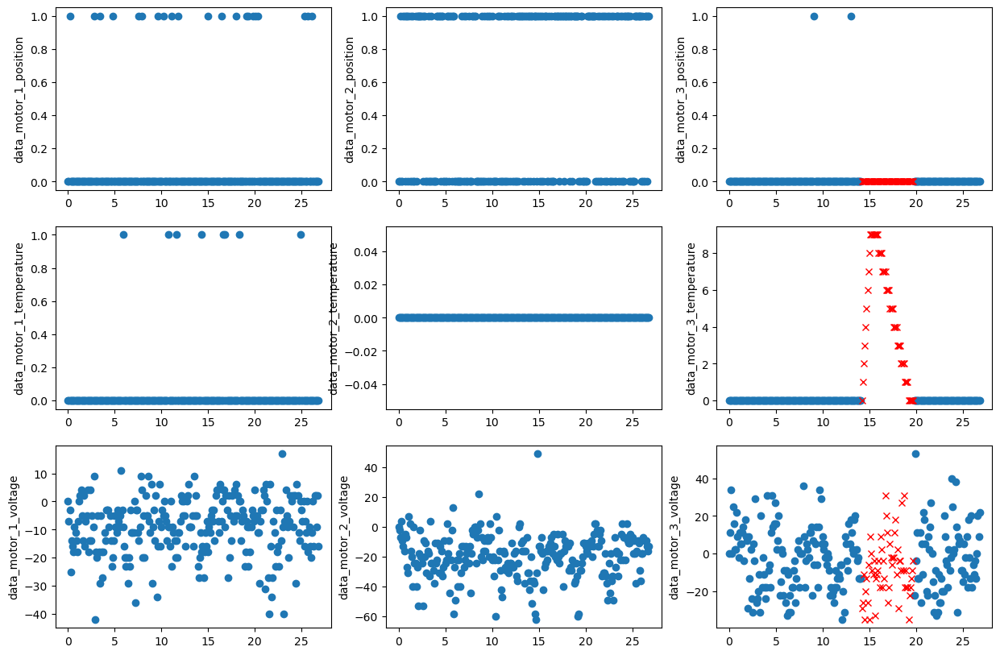

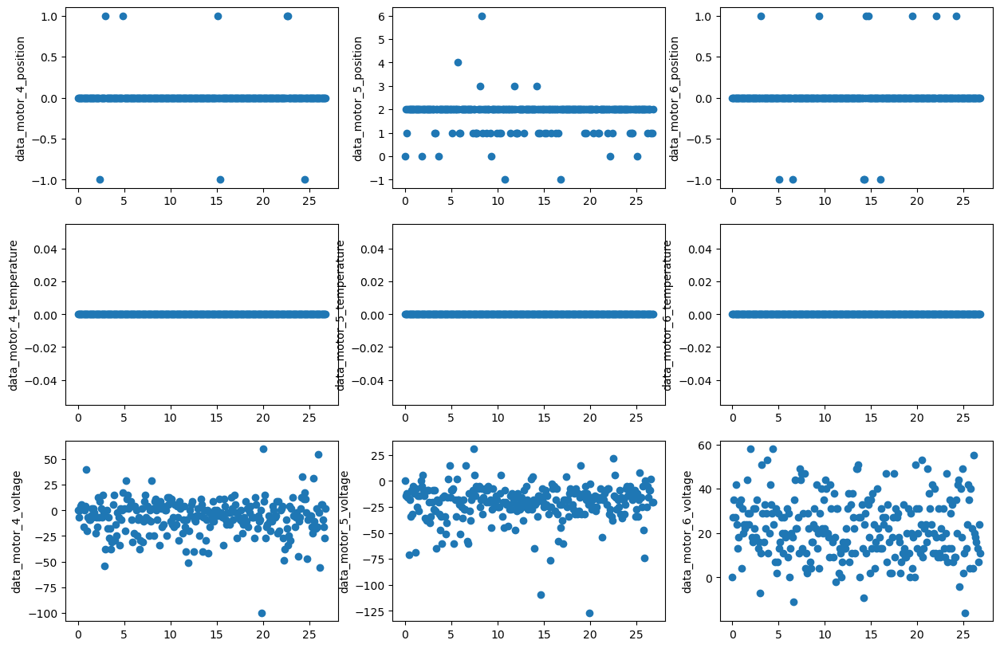

20240604_102364: Series([], Name: Description, dtype: object)



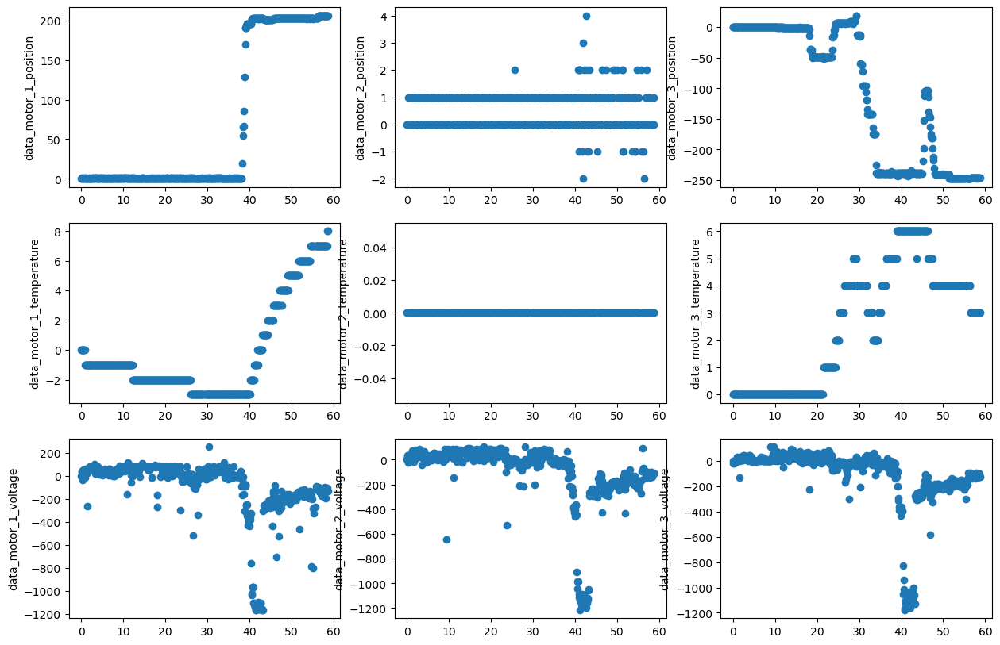

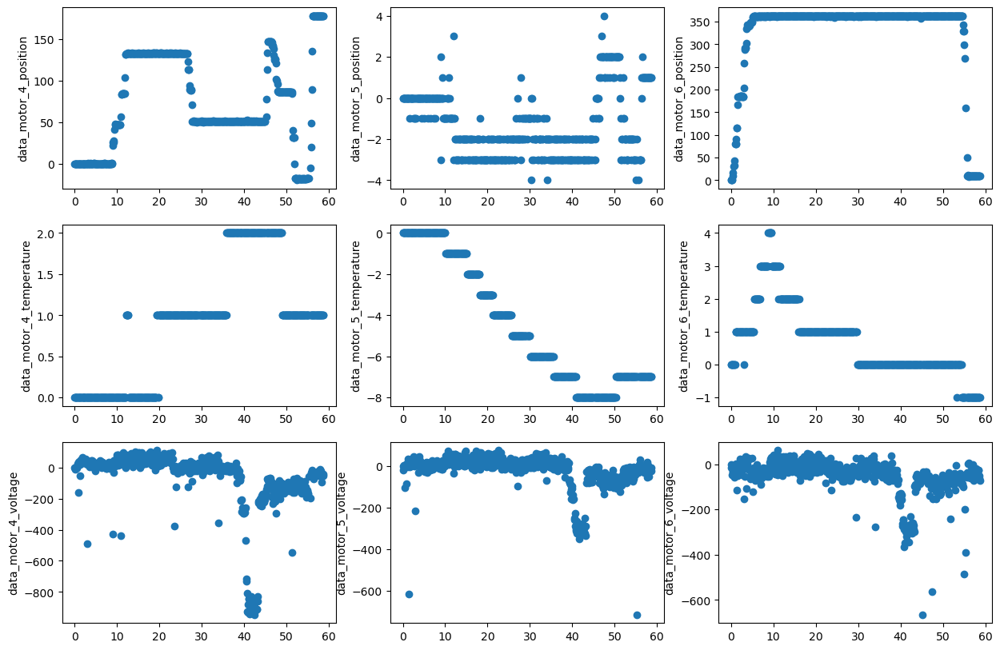

20240604_102910: Series([], Name: Description, dtype: object)



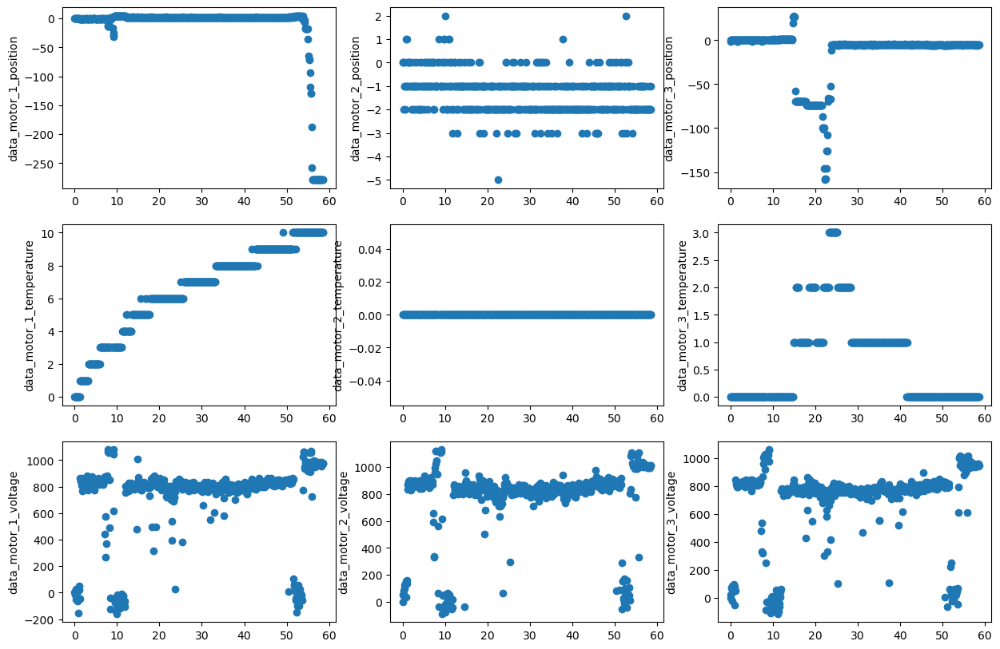

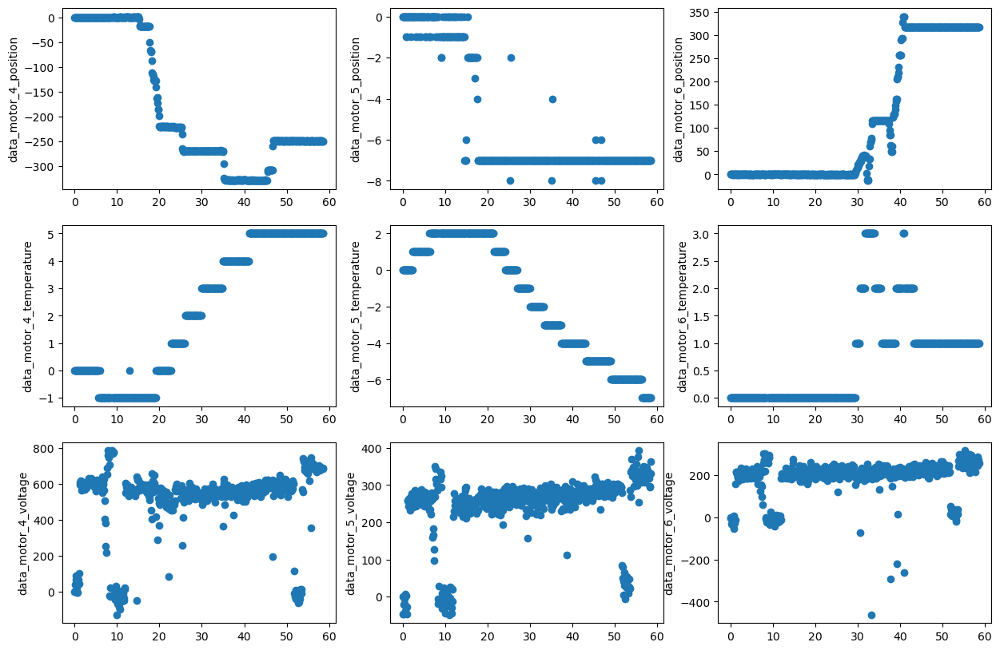

20240604_103225: Series([], Name: Description, dtype: object)



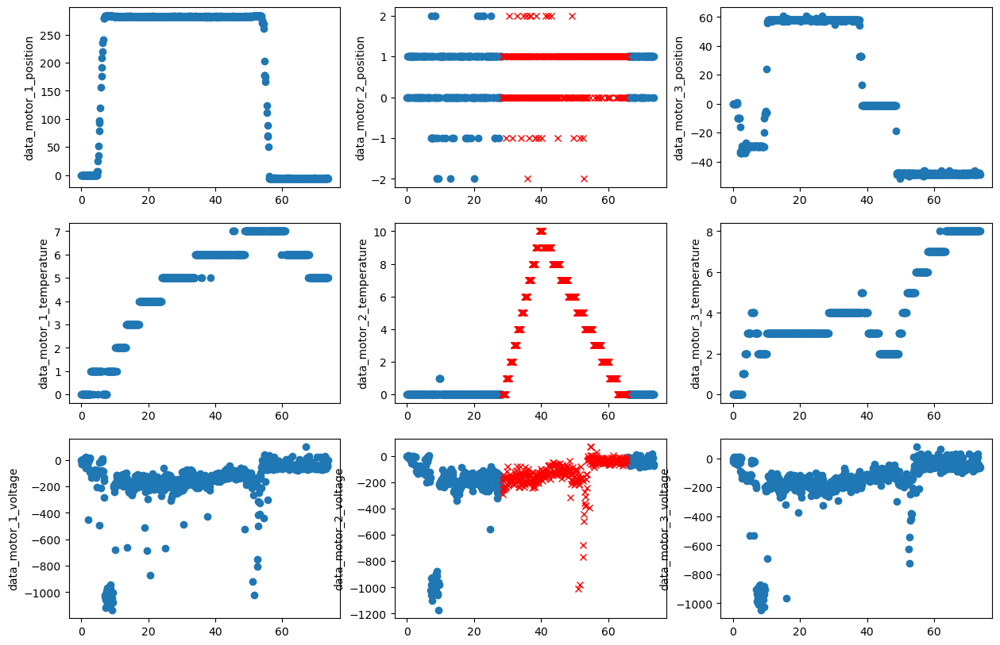

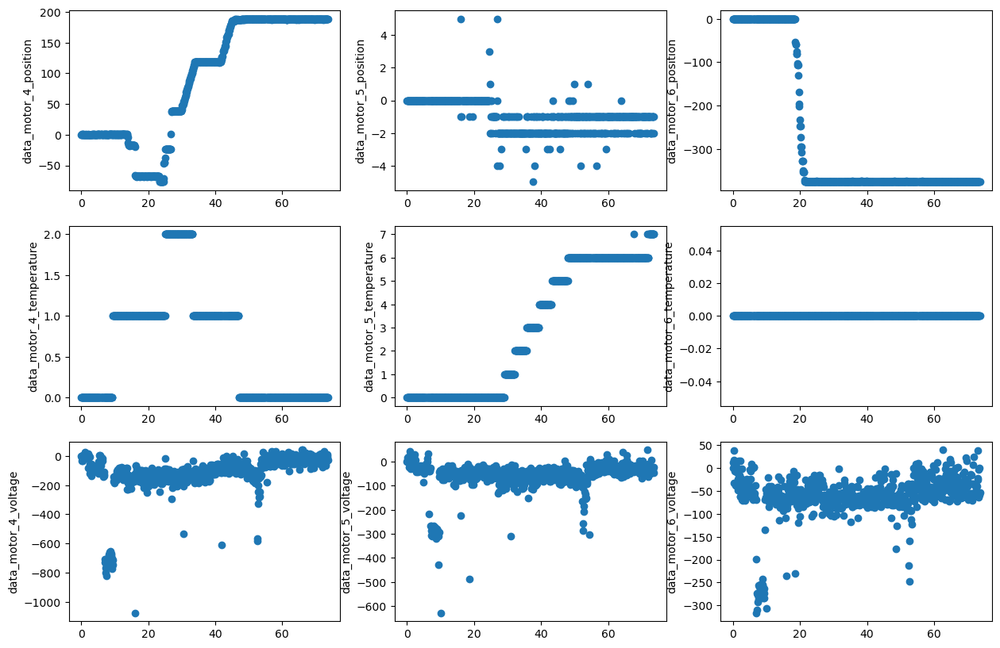

20240604_103374: Series([], Name: Description, dtype: object)



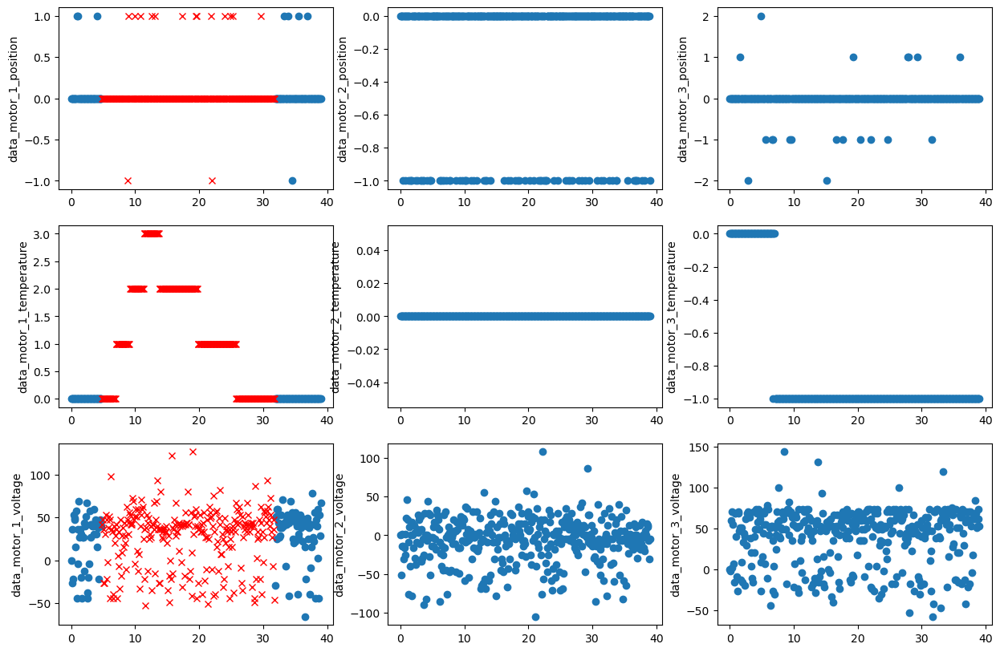

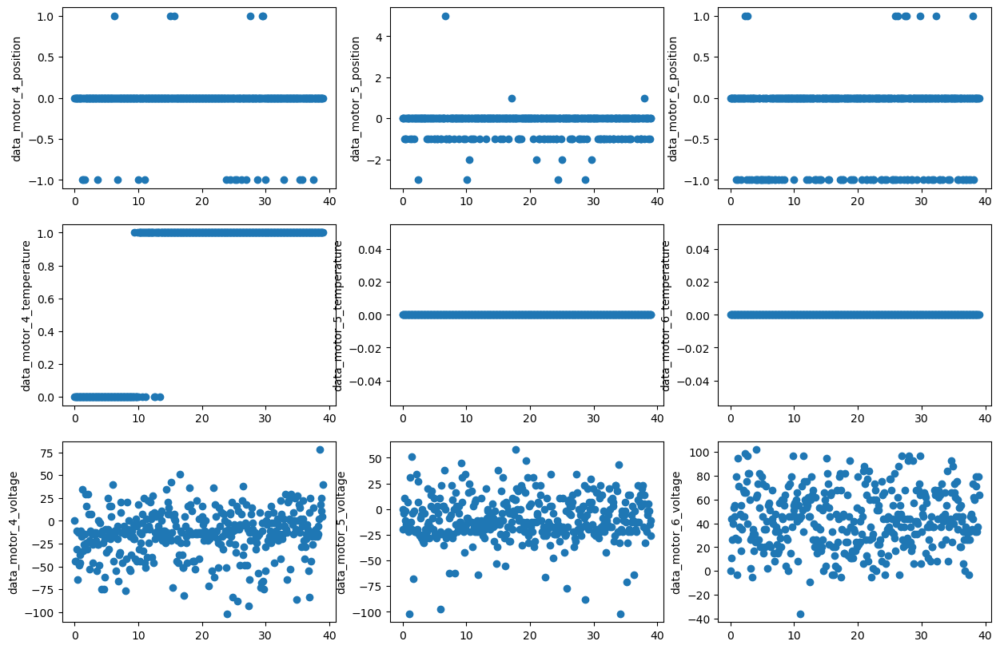

20240604_103587: Series([], Name: Description, dtype: object)



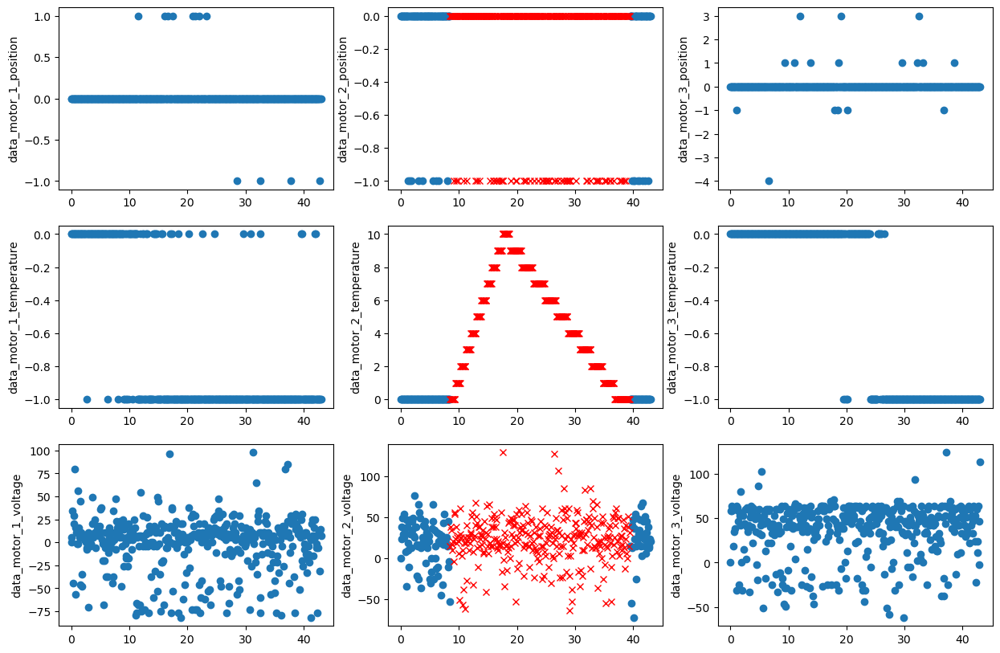

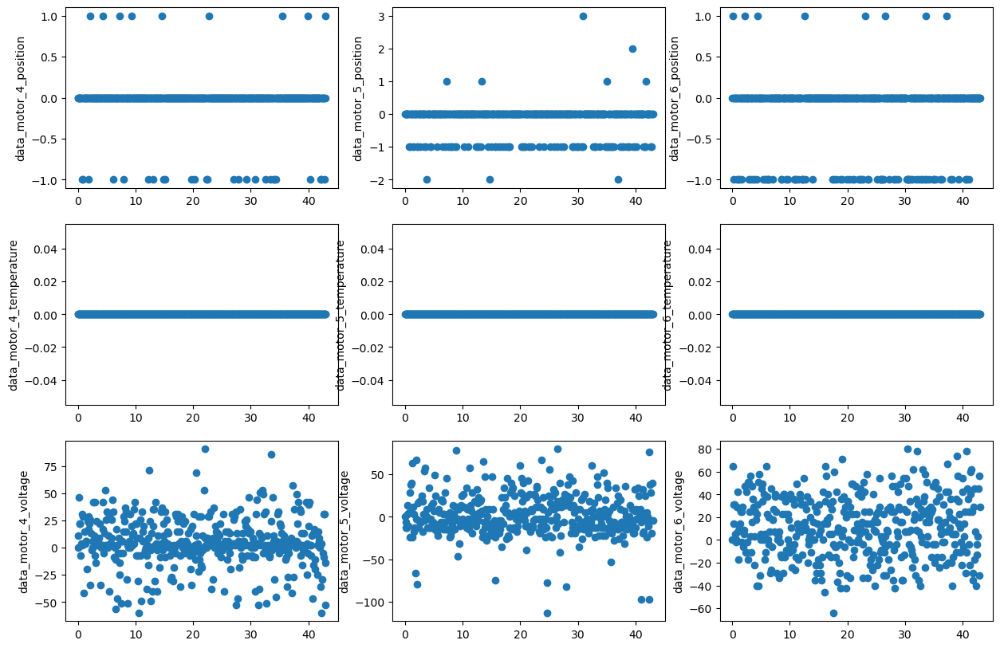

20240604_103875: Series([], Name: Description, dtype: object)



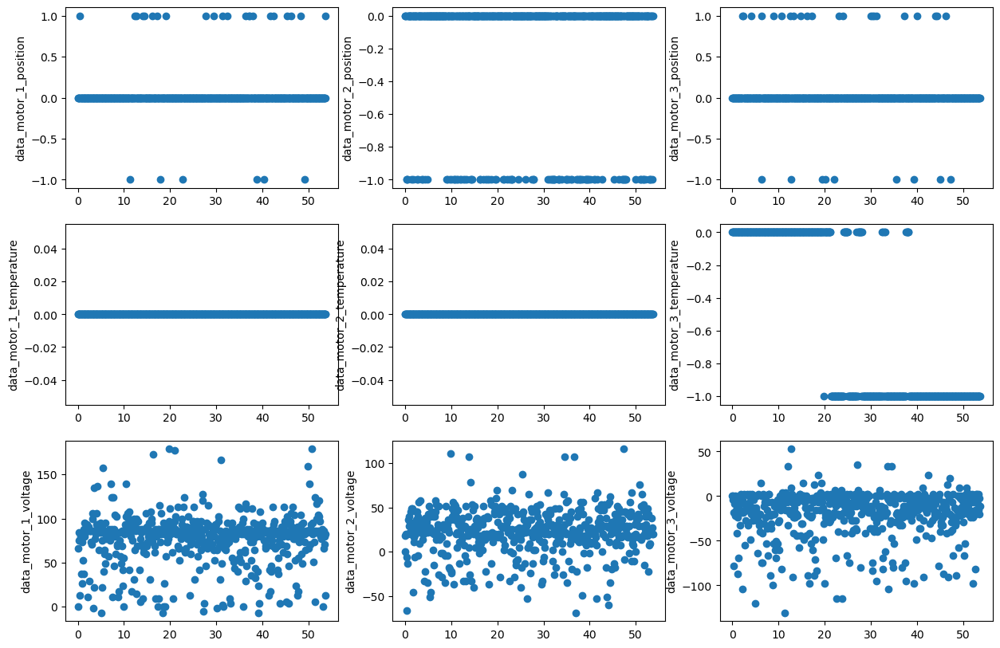

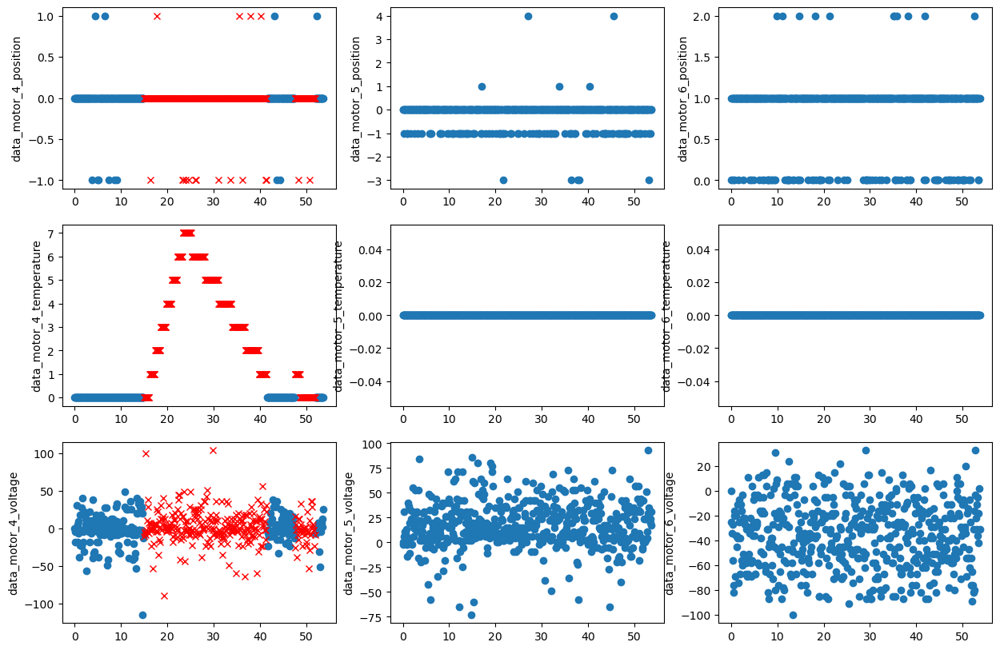

20240604_104025: Series([], Name: Description, dtype: object)



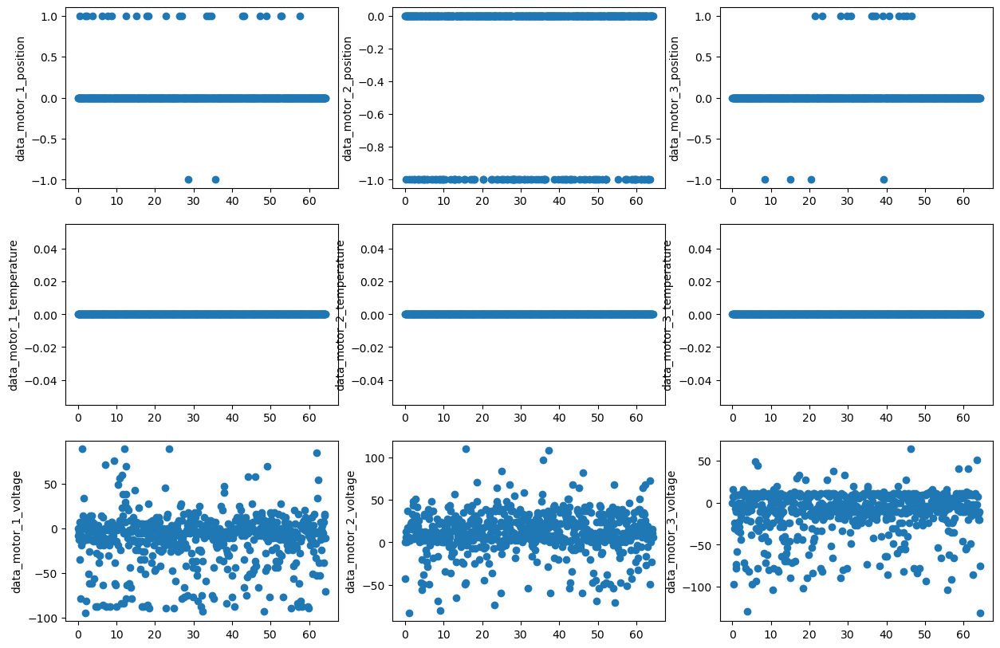

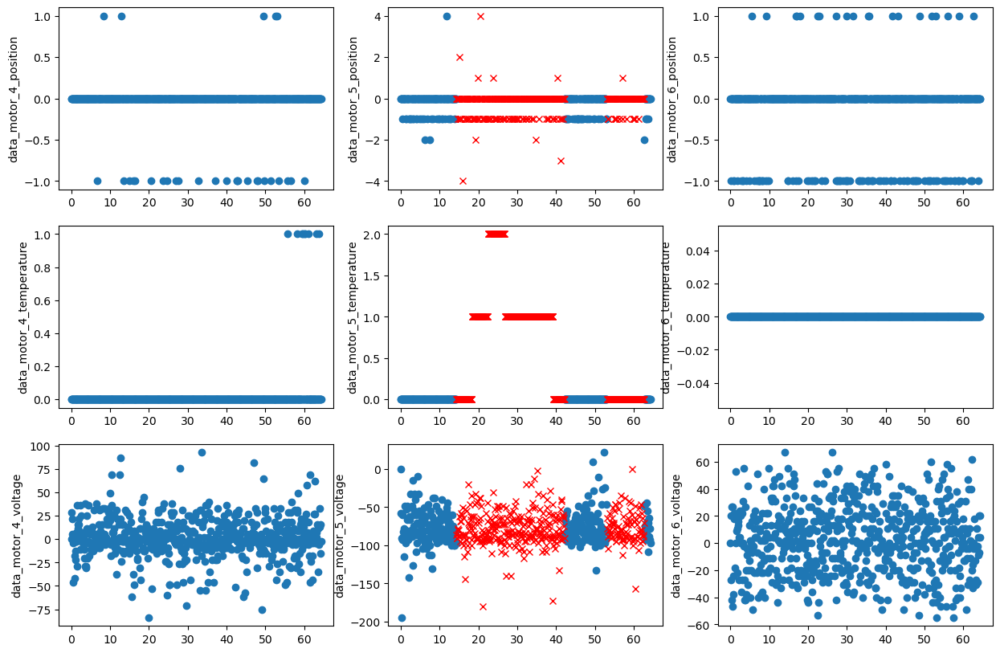

20240604_104412: Series([], Name: Description, dtype: object)



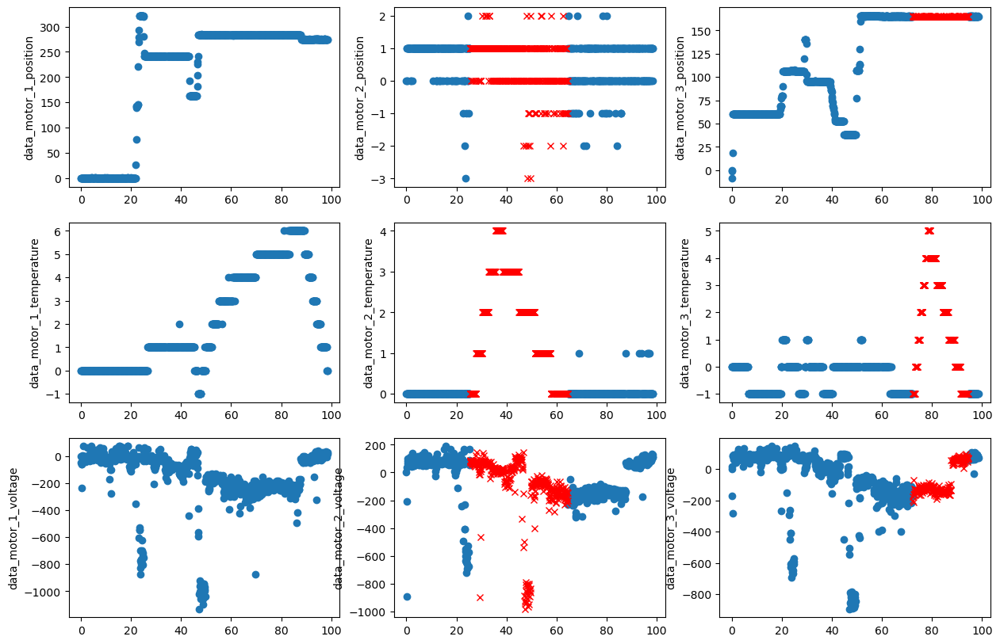

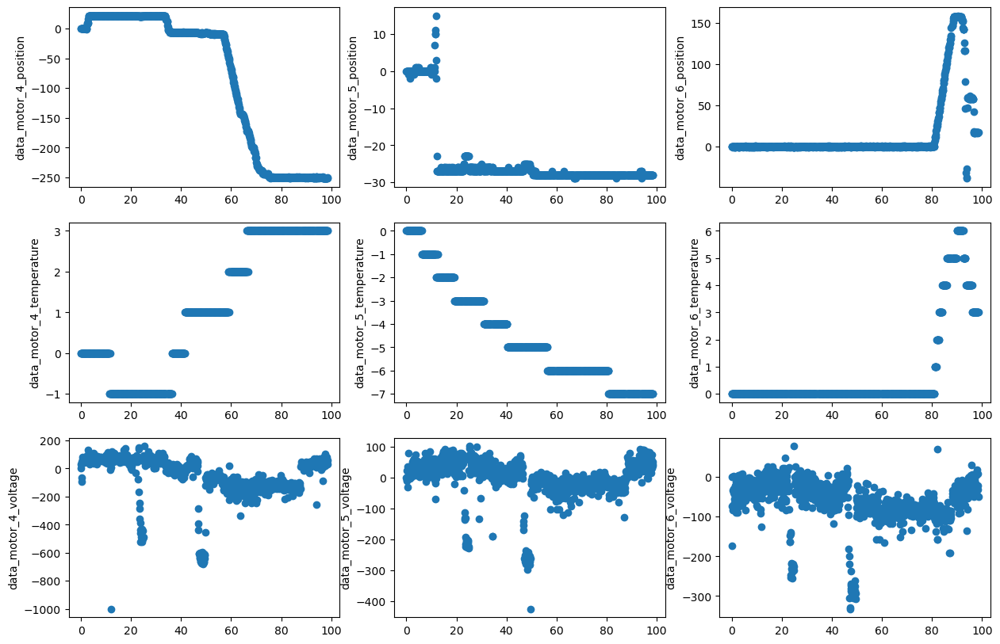

20240604_104765: Series([], Name: Description, dtype: object)



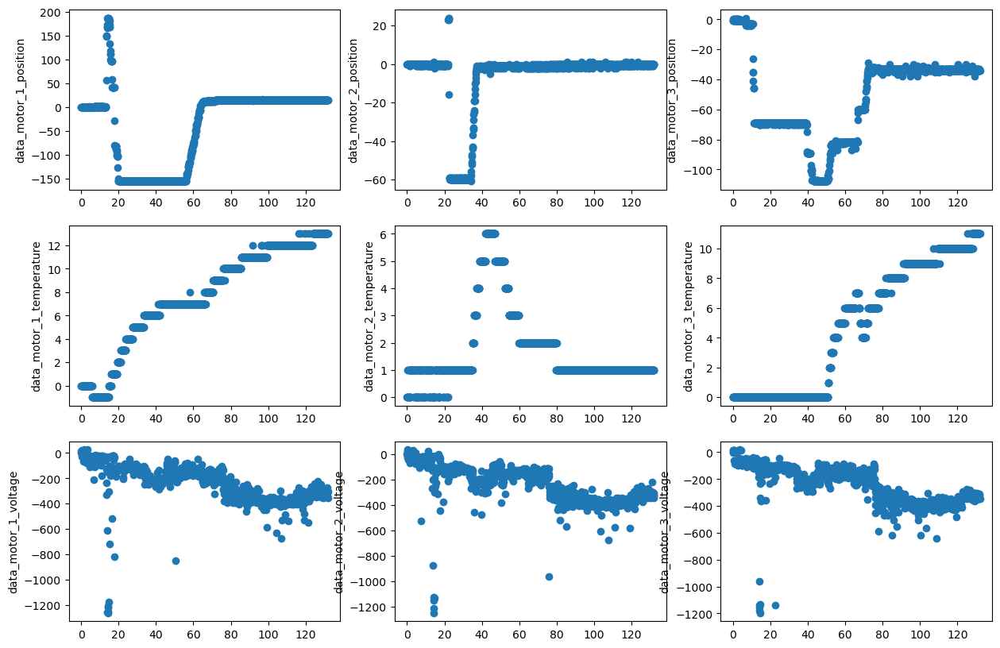

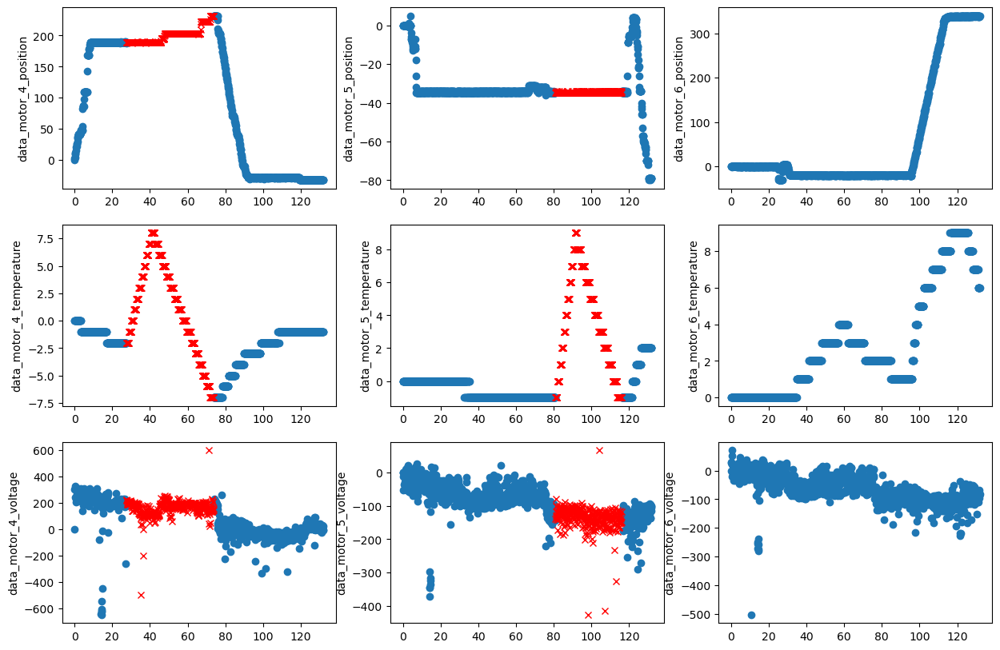

In [254]:
# Ignore warnings.
# Read all the dataset. Change to your dictionary if needed.
base_dictionary = 'training_data/training_data/'
df_train = read_all_test_data_from_path(base_dictionary, pre_processing, is_plot=True)

<Axes: >

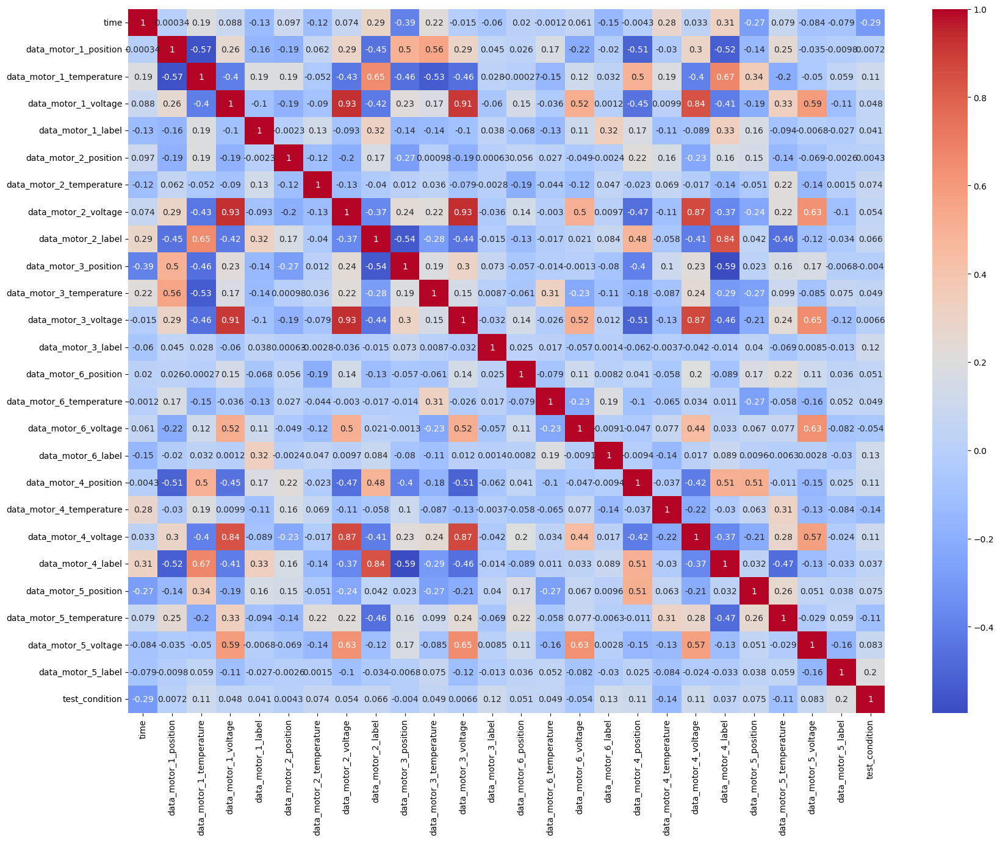

In [255]:
import seaborn as sns
import matplotlib.pyplot as plt
corr_matr = df_train.corr()

# Plot correlation matrix using seaborn
plt.figure(figsize=(20, 15))
sns.heatmap(corr_matr, annot=True, cmap='coolwarm')

20240527_094865: 0    Transfer goods
Name: Description, dtype: object



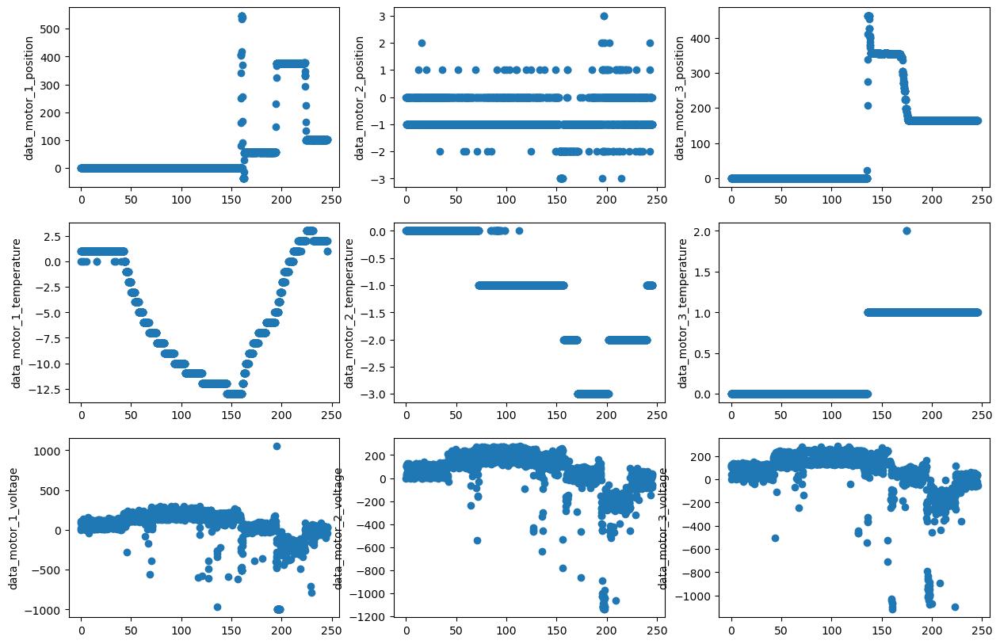

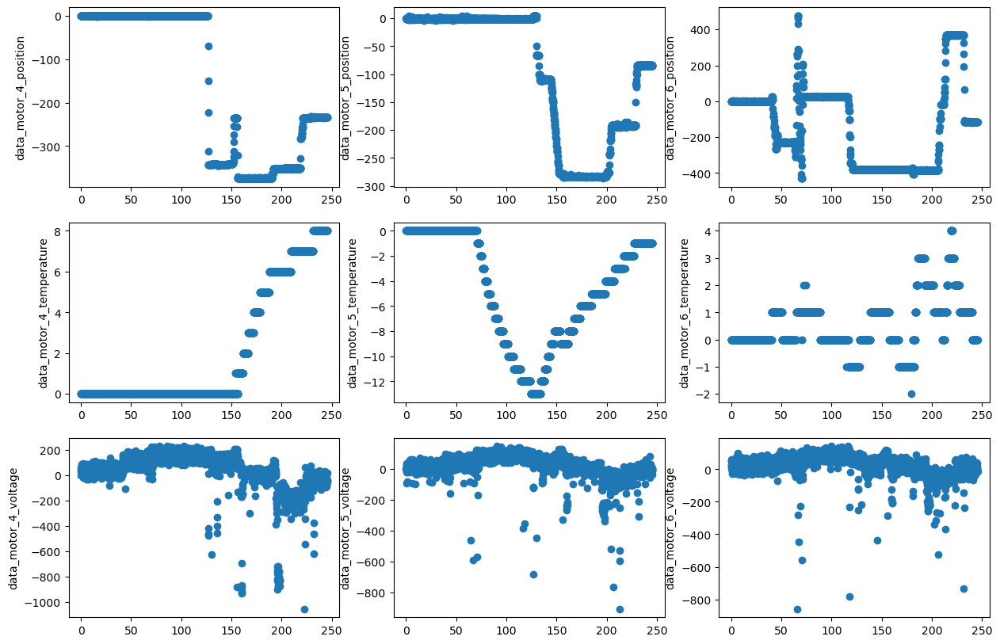

20240527_100759: 1    Transfer goods
Name: Description, dtype: object



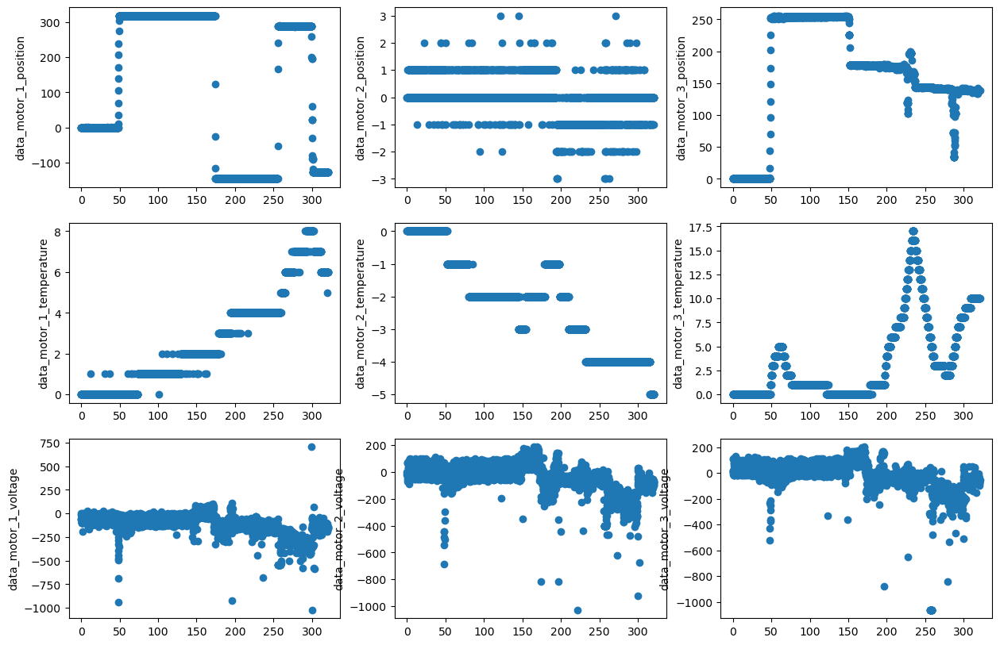

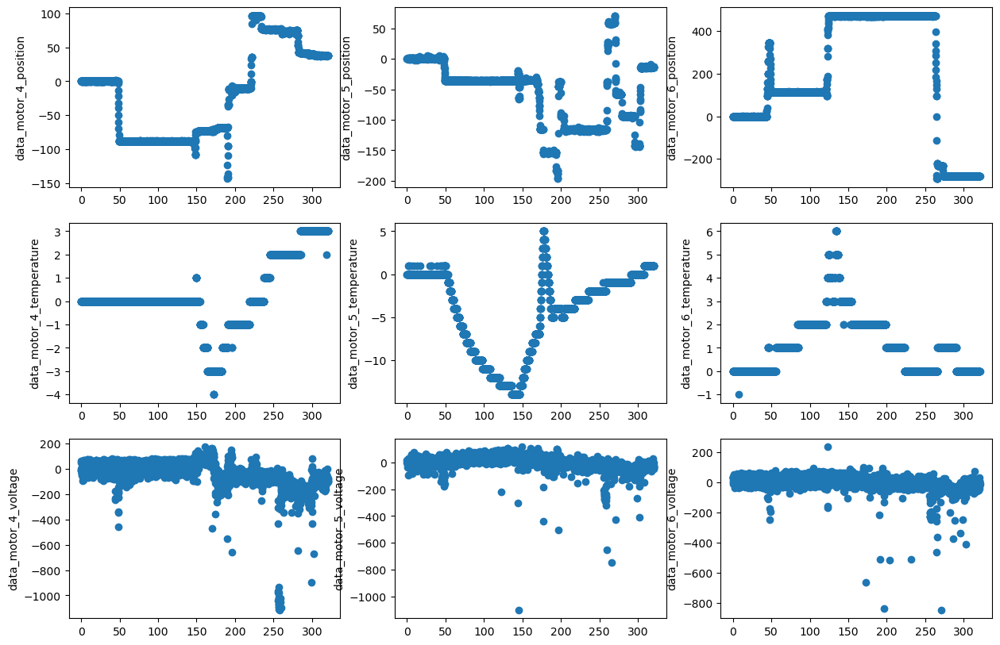

20240527_101627: 2    Transfer goods
Name: Description, dtype: object



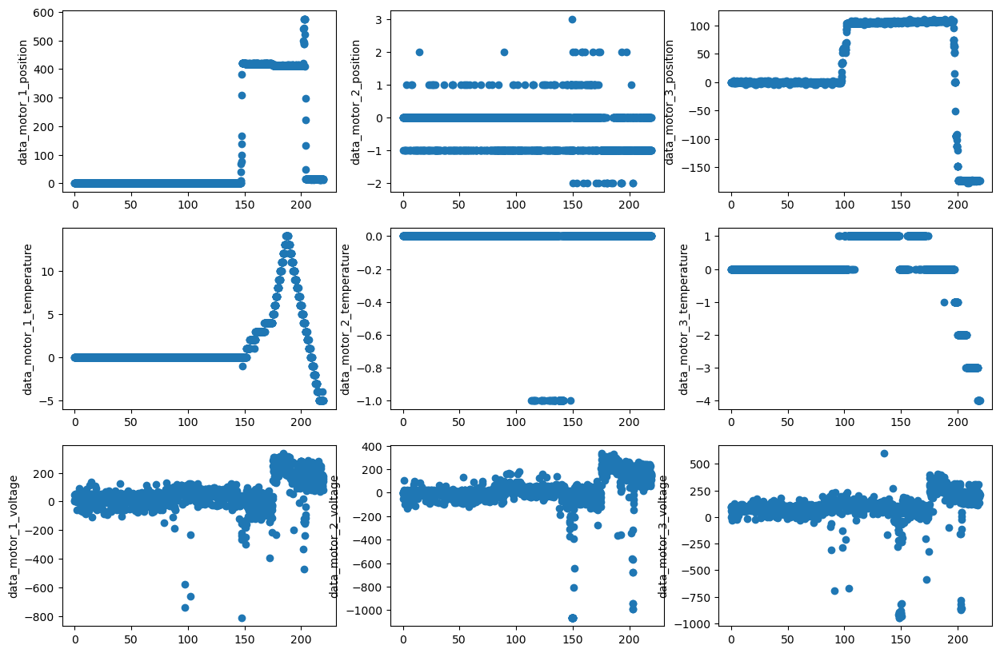

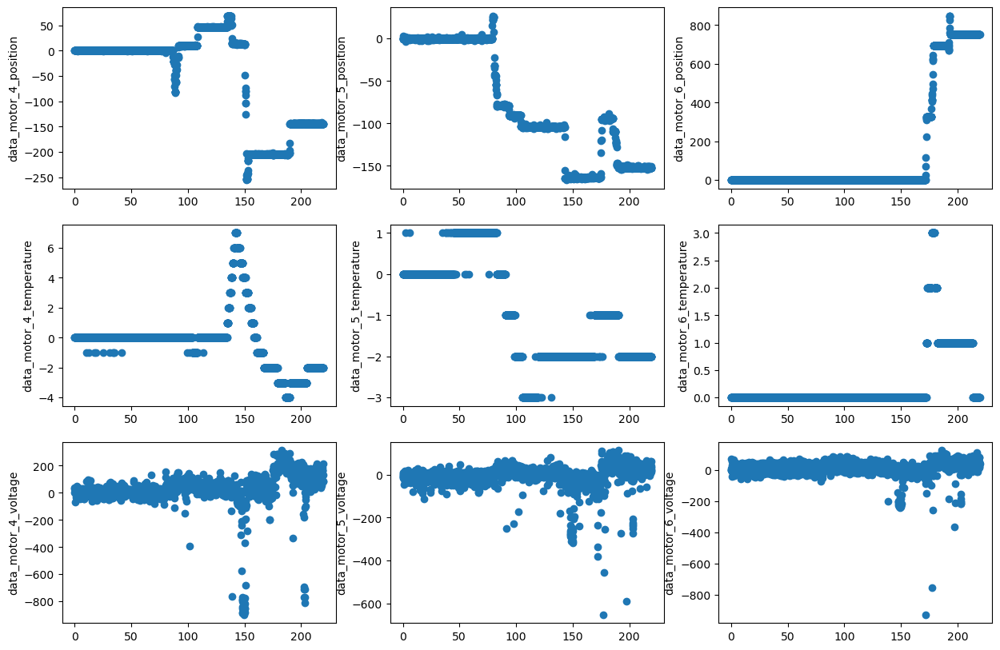

20240527_102436: 3    Not moving
Name: Description, dtype: object



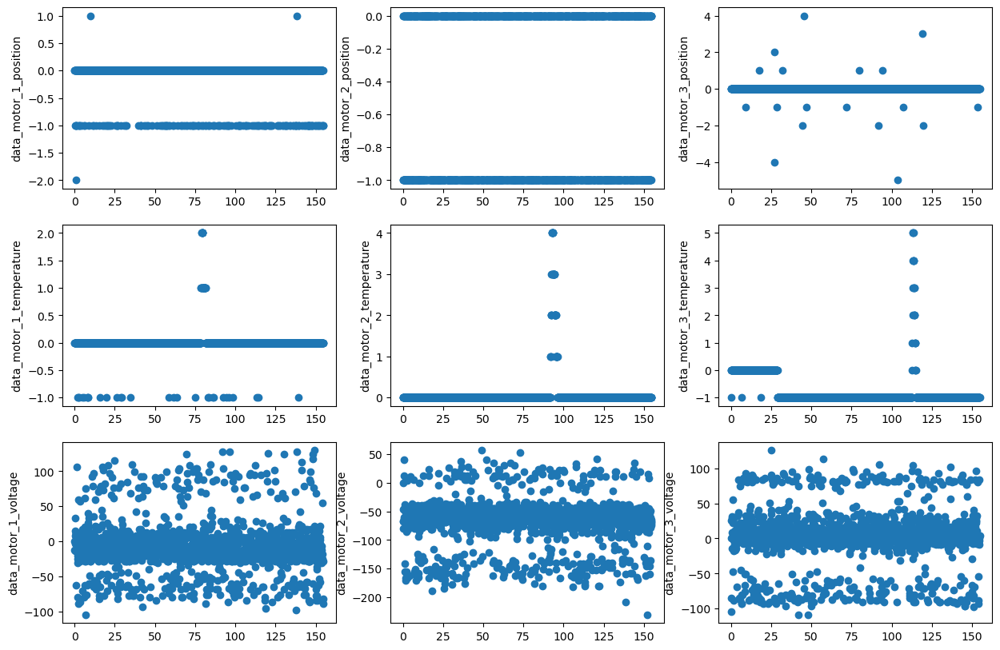

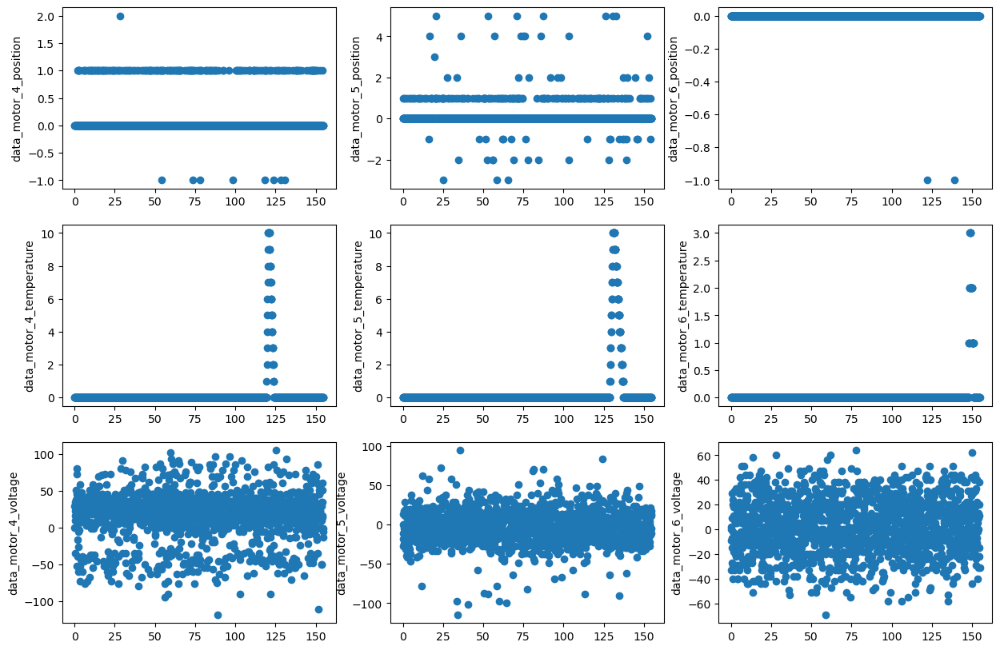

20240527_102919: 4    Not moving
Name: Description, dtype: object



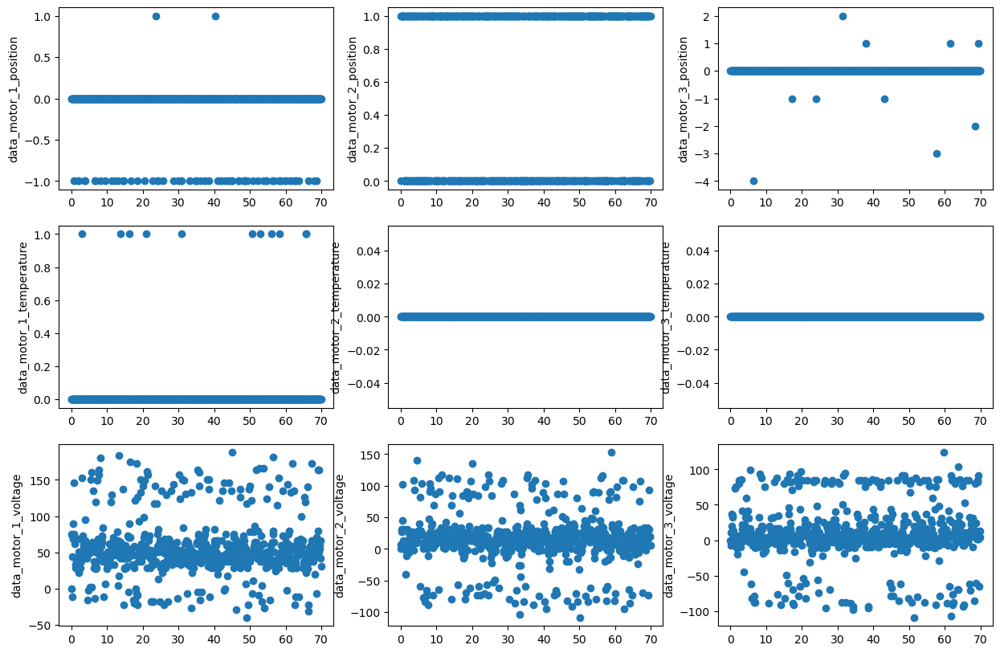

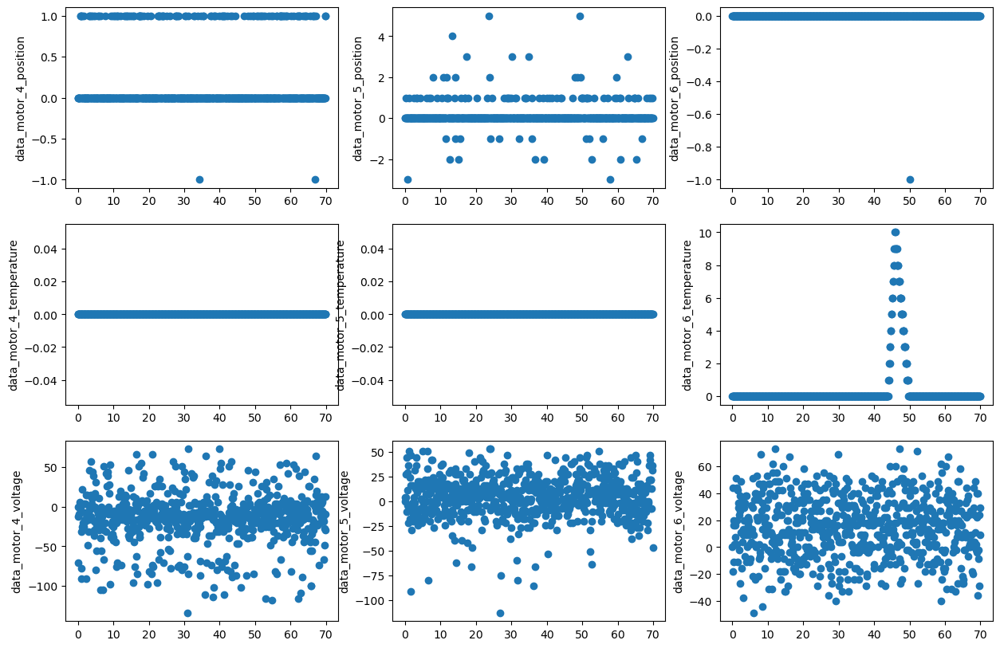

20240527_103311: 5    Not moving
Name: Description, dtype: object



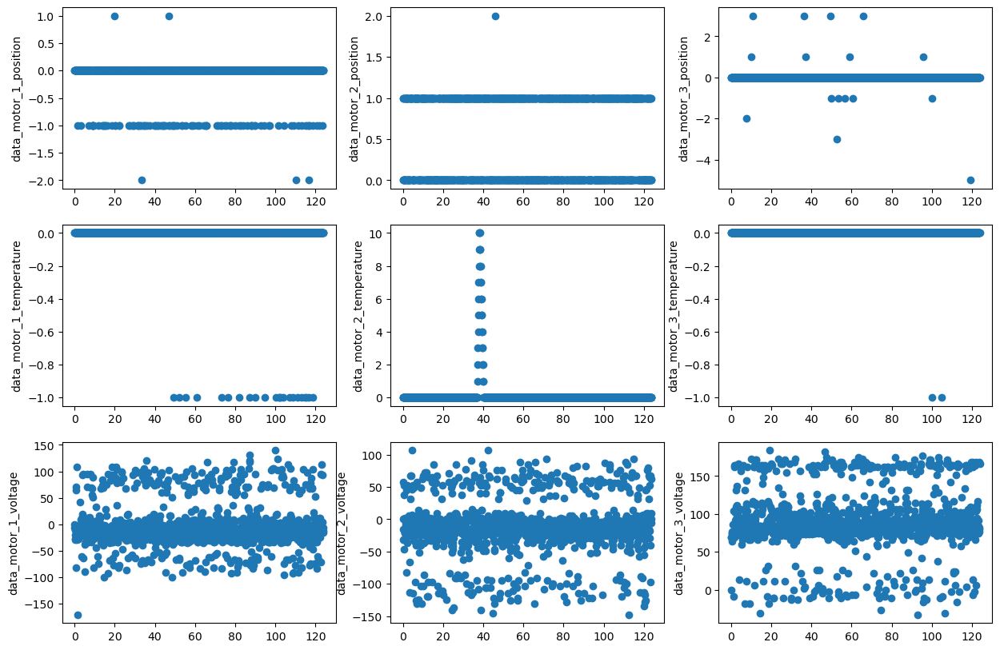

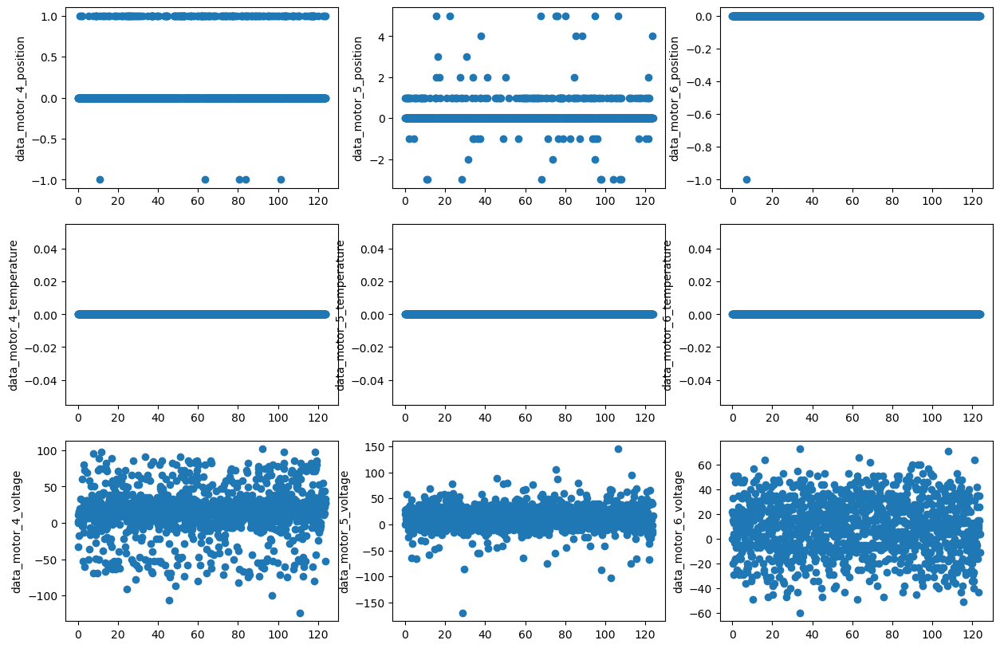

20240527_103690: 6    Moving one motor
Name: Description, dtype: object



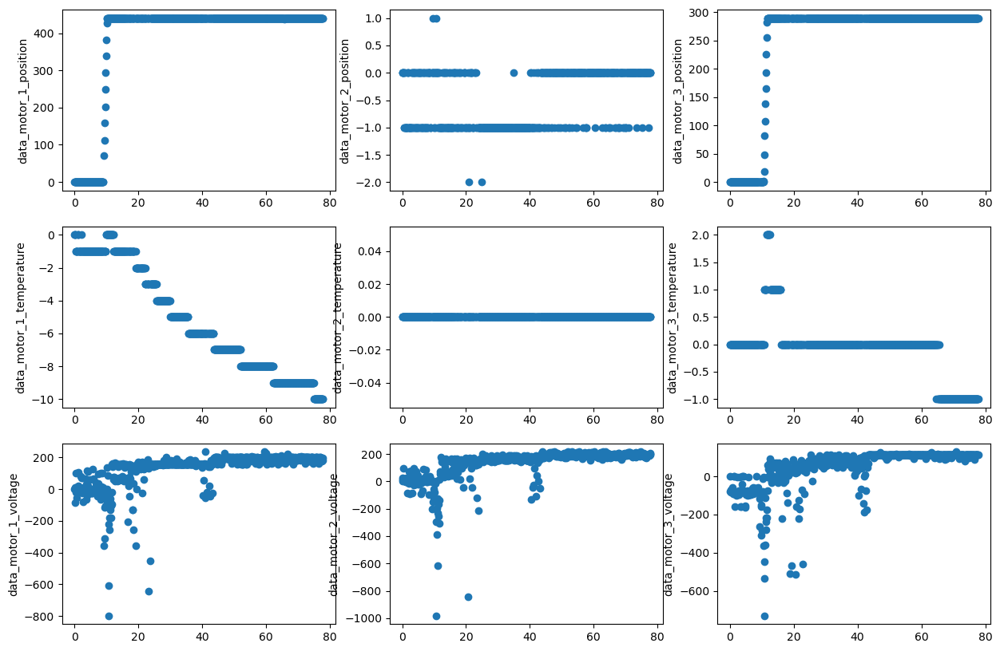

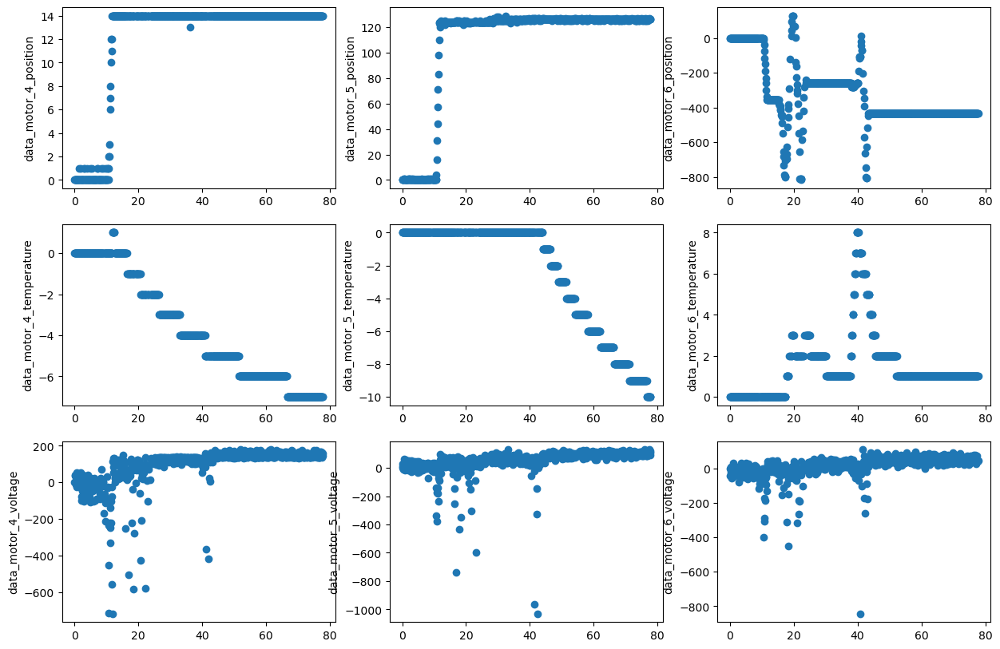

20240527_104247: 7    Moving one motor
Name: Description, dtype: object



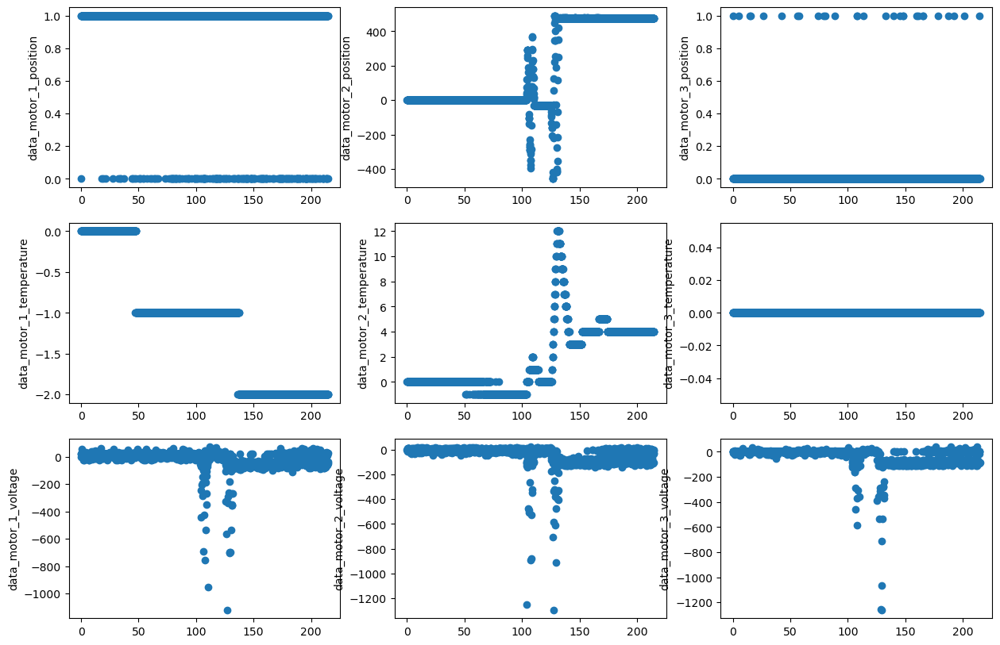

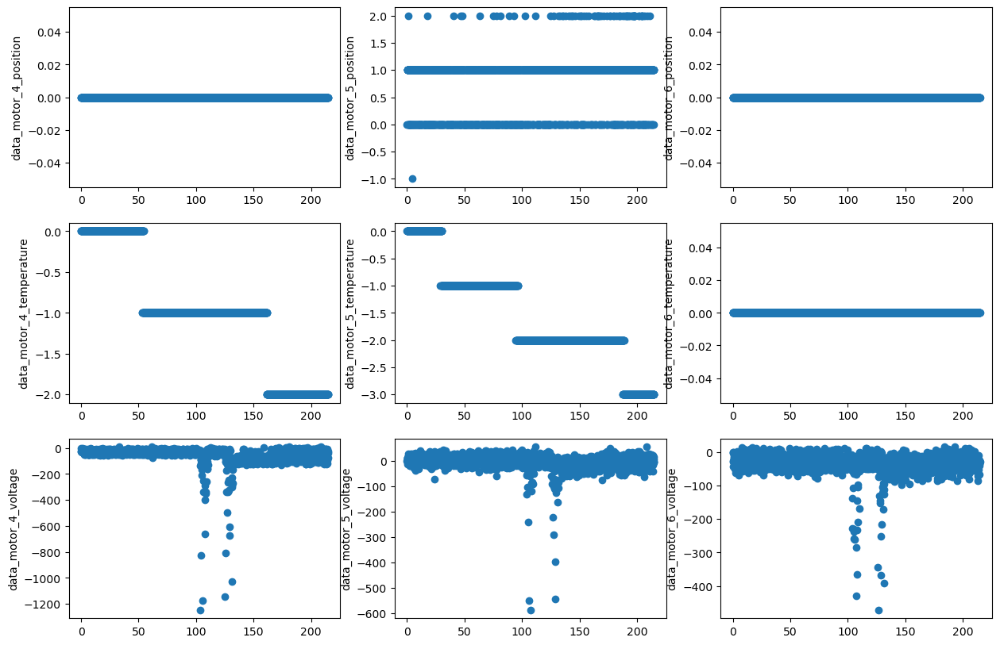

In [256]:
# Read all the dataset. Change to your dictionary if needed.
base_dictionary = 'testing_data/testing_data/'
df_test = read_all_test_data_from_path(base_dictionary, pre_processing, is_plot=True)

In [ ]:
df_train_experiment = df_train[df_train['test_condition'].isin(['20240425_093699', '20240425_094425', '20240426_140055',
                                                       '20240503_164675', '20240503_165189',
                                                       '20240503_163963', '20240325_155003'])]

In [387]:
# Specify the test conditions you would like to include in the training.
df_train_experiment = df_train[df_train['test_condition'].isin(['20240425_093699', '20240425_094425', '20240426_140055',
                                                       '20240503_164675', '20240503_165189',
                                                       '20240503_163963', '20240325_155003',
                                                       '20240604_101954', '20240604_102364', '20240604_103374',
                                                       '20240604_103587', '20240604_103875', '20240604_104025',
                                                       '20240604_104412', '20240604_104765'])]

In [264]:
df_train_experiment 

,time,data_motor_1_position,data_motor_1_temperature,data_motor_1_voltage,data_motor_1_label,data_motor_2_position,data_motor_2_temperature,data_motor_2_voltage,data_motor_2_label,data_motor_3_position,...,data_motor_6_label,data_motor_4_position,data_motor_4_temperature,data_motor_4_voltage,data_motor_4_label,data_motor_5_position,data_motor_5_temperature,data_motor_5_voltage,data_motor_5_label,test_condition
24483,0.000000,0.0,0.0,0.0,0,0.0,0.0,0.0,1,0.0,...,0,0.0,0.0,0.0,1,0.0,0.0,0.0,0,20240325_155003
24484,0.100010,0.0,1.0,-16.0,0,0.0,0.0,11.0,1,1.0,...,0,0.0,0.0,47.0,1,-1.0,-1.0,-29.0,0,20240325_155003
24485,0.200030,0.0,1.0,-7.0,0,1.0,0.0,13.0,1,1.0,...,0,0.0,-1.0,27.0,1,-1.0,-1.0,-4.0,0,20240325_155003
24486,0.299980,0.0,1.0,11.0,0,1.0,0.0,13.0,1,0.0,...,0,0.0,0.0,51.0,1,-1.0,-1.0,-18.0,0,20240325_155003
24487,0.400000,0.0,1.0,9.0,0,0.0,0.0,42.0,1,1.0,...,0,0.0,0.0,31.0,1,-1.0,-1.0,4.0,0,20240325_155003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45724,131.497169,15.0,13.0,-319.0,0,0.0,1.0,-313.0,0,-33.0,...,0,-33.0,-1.0,11.0,0,-79.0,2.0,-96.0,0,20240604_104765
45725,131.597233,15.0,13.0,-333.0,0,0.0,1.0,-344.0,0,-34.0,...,0,-33.0,-1.0,11.0,0,-79.0,2.0,-105.0,0,20240604_104765
45726,131.697251,15.0,13.0,-275.0,0,0.0,1.0,-319.0,0,-34.0,...,0,-33.0,-1.0,-7.0,0,-79.0,2.0,-116.0,0,20240604_104765
45727,131.797539,15.0,13.0,-355.0,0,0.0,1.0,-328.0,0,-34.0,...,0,-33.0,-1.0,-9.0,0,-79.0,2.0,-102.0,0,20240604_104765


## Model for motor 5.

Please copy this section for the other motors as well.

### Summary of the model 5.

In this section, please give a brief summary of the final model you used for this motor. Important details include but not limited to:
- Which model

random forest
- What are the features you used?

['time', 'data_motor_1_temperature', 'data_motor_1_voltage', 'data_motor_1_position',
'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
'data_motor_5_temperature', 'data_motor_5_voltage', 'data_motor_5_position',
'data_motor_6_temperature', 'data_motor_6_voltage', 'data_motor_6_position',] 

- Do you tune hyperparameters? If yes, how?

yes regularization parameter with grid search
- Do you consider the imbalance in the data? If yes, how?

yes with balanced class weight

### Training

In this section, summarize how do you train your model, and put the code here.
prepare the windows, fit the gridsearch, take the best model

In [337]:
from utility import extract_selected_feature, prepare_sliding_window

# Define the motor index.
motor_idx = 6

# Define the features.
feature_list_all = ['time', 'data_motor_1_temperature', 'data_motor_1_voltage', 'data_motor_1_position',
                    'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
                    'data_motor_5_temperature', 'data_motor_5_voltage', 'data_motor_5_position',
                    'data_motor_6_temperature', 'data_motor_6_voltage', 'data_motor_6_position',] 
# Extract the features.
df_tr_x, df_tr_y = extract_selected_feature(df_data=df_train_experiment, feature_list=feature_list_all, motor_idx=motor_idx, mdl_type='clf')


In [135]:
from utility import extract_selected_feature, prepare_sliding_window

# Define the motor index.
motor_idx = 6

# Specify the test conditions you would like to include in the training.
df_train_experiment = df_train[df_train['test_condition'].isin(['20240425_093699', '20240425_094425', '20240426_140055',
                                                       '20240503_164675', '20240503_165189',
                                                       '20240503_163963', '20240325_155003'])]

# Define the features.
feature_list_all = ['time',
                    'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_5_temperature', 'data_motor_5_voltage', 'data_motor_5_position',
                    'data_motor_6_temperature', 'data_motor_6_voltage', 'data_motor_6_position',]
# Extract the features.
df_tr_x, df_tr_y = extract_selected_feature(df_data=df_train_experiment, feature_list=feature_list_all, motor_idx=motor_idx, mdl_type='clf')


In [ ]:
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
# Prepare the training data based on the defined sliding window.
window_size = 20
sample_step = 2
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')

# Create a SMOTE object
smote = SMOTE()

# Fit the SMOTE object to the training data
X_train_oversampled, y_train_oversampled = smote.fit_resample(X_train, y_train)

# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', LogisticRegression(class_weight='balanced'))    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__C': [0.01, 0.1, 1, 10, 100]  # Inverse of regularization strength
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=5)

# Train the model.
mdl = grid_search.fit(X_train, y_train)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

In [336]:
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
# Prepare the training data based on the defined sliding window.
window_size = 4
sample_step = 2
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')

# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', RandomForestClassifier(class_weight='balanced'))    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__criterion': ['gini', 'entropy'],  # Inverse of regularization strength
    'mdl__max_depth': [3, 5, 10, 15, 20, 25, 30, 50]
    
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=7)

# Train the model.
mdl = grid_search.fit(X_train, y_train)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 3}
Mean Test Score: 0.49428473977941595
Std Test Score: 0.20659981223228208
Rank: 13

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 5}
Mean Test Score: 0.4444048044478266
Std Test Score: 0.15623113186583182
Rank: 15

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 10}
Mean Test Score: 0.5387441002789187
Std Test Score: 0.20426324481803687
Rank: 9

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 15}
Mean Test Score: 0.5121972936152649
Std Test Score: 0.21961423626926138
Rank: 11

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 20}
Mean Test Score: 0.5569283905678891
Std Test Score: 0.22552987829764362
Rank: 4

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 25}
Mean Test Score: 0.5464314983800405
Std Test Score: 0.2320075160871425
Rank: 7

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 30}
Mean Test Score: 0.5548406058292847
Std Test Score: 0.2484554396882067
Rank: 5

Parame

In [97]:
# Prepare the training data based on the defined sliding window.
window_size = 100
sample_step = 10
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')

# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', SVC(class_weight='balanced'))    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__C': [0.01, 0.1, 1, 10],  # Inverse of regularization strength
    'mdl__kernel': ['rbf', 'sigmoid'],  # Kernel type
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=5)

# Train the model.
mdl = grid_search.fit(X_train, y_train)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

Parameters: {'mdl__C': 0.01, 'mdl__kernel': 'rbf'}
Mean Test Score: 0.4617578452078807
Std Test Score: 0.10178359402644081
Rank: 5

Parameters: {'mdl__C': 0.01, 'mdl__kernel': 'sigmoid'}
Mean Test Score: 0.4953451365084609
Std Test Score: 0.29169525753468606
Rank: 4

Parameters: {'mdl__C': 0.1, 'mdl__kernel': 'rbf'}
Mean Test Score: 0.5121129542175831
Std Test Score: 0.1742105758626927
Rank: 3

Parameters: {'mdl__C': 0.1, 'mdl__kernel': 'sigmoid'}
Mean Test Score: 0.34894680816323365
Std Test Score: 0.1038462791017409
Rank: 7

Parameters: {'mdl__C': 1, 'mdl__kernel': 'rbf'}
Mean Test Score: 0.5798922953073503
Std Test Score: 0.2034413933911477
Rank: 1

Parameters: {'mdl__C': 1, 'mdl__kernel': 'sigmoid'}
Mean Test Score: 0.3411112205610006
Std Test Score: 0.09937730379745836
Rank: 8

Parameters: {'mdl__C': 10, 'mdl__kernel': 'rbf'}
Mean Test Score: 0.5556083149793032
Std Test Score: 0.18662578849261893
Rank: 2

Parameters: {'mdl__C': 10, 'mdl__kernel': 'sigmoid'}
Mean Test Score: 0.3726

In [338]:
# Add test_condition for extracting different sequences.
feature_list_all.append('test_condition')
# Get the features.
df_test_x = df_test[feature_list_all]
# Augument the features in the same way as the training data.
X_test = prepare_sliding_window(df_x=df_test_x, window_size=window_size, sample_step=sample_step, mdl_type='clf')
# Make prediction.
y_pred_6 = grid_search.predict(X_test)

In [132]:
# Prepare for the testing dataset.
# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage',
                    'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_temperature', 'data_motor_6_voltage']
# Add test_condition for extracting different sequences.
feature_list_all.append('test_condition')
# Get the features.
df_test_x = df_test[feature_list_all]
# Augument the features in the same way as the training data.
X_test = prepare_sliding_window(df_x=df_test_x, window_size=window_size, sample_step=sample_step, mdl_type='clf')
# Make prediction.
y_pred_6 = grid_search.predict(X_test)

In [339]:
Counter(y_pred_6)

Counter({0: 13911, 1: 246})

In [340]:
from datetime import datetime

# Get the current date and time
current_datetime = datetime.now()

df123456 = pd.read_csv('sub6.csv')
df123456['data_motor_6_label'] = y_pred_6
df123456.to_csv(f'new_sub6.csv', index=False)

In [134]:
from datetime import datetime

# Get the current date and time
current_datetime = datetime.now()

df123456 = pd.read_csv('submission_best4.csv')
df123456['data_motor_6_label'] = y_pred_6
df123456.to_csv(f'submission_123456c_{current_datetime}.csv', index=False)

## Model for motor 5.

Please copy this section for the other motors as well.

### Summary of the model 5.

In this section, please give a brief summary of the final model you used for this motor. Important details include but not limited to:
- Which model

support vector machine
- What are the features you used?

['data_motor_1_temperature', 'data_motor_1_voltage',
'data_motor_2_temperature', 'data_motor_2_voltage',
'data_motor_3_temperature', 'data_motor_3_voltage',
'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
'data_motor_5_temperature', 'data_motor_5_voltage', 'data_motor_5_position']

- Do you tune hyperparameters? If yes, how?

yes regularization parameter with grid search
- Do you consider the imbalance in the data? If yes, how?

yes with balanced class weight

### Training

In this section, summarize how do you train your model, and put the code here.
prepare the windows, fit the gridsearch, take the best model

In [346]:
from utility import extract_selected_feature, prepare_sliding_window

# Define the motor index.
motor_idx = 5

# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
                    'data_motor_5_temperature', 'data_motor_5_voltage', 'data_motor_5_position']
# Extract the features.
df_tr_x, df_tr_y = extract_selected_feature(df_data=df_train_experiment, feature_list=feature_list_all, motor_idx=motor_idx, mdl_type='clf')


In [353]:
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from imblearn.over_sampling import SMOTE
# Prepare the training data based on the defined sliding window.
window_size = 50
sample_step = 10
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')


# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', DecisionTreeClassifier())    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__criterion': ['gini', 'entropy']  # Inverse of regularization strength
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=5)

# Train the model.
mdl = grid_search.fit(X_train, y_train)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

Parameters: {'mdl__criterion': 'gini'}
Mean Test Score: 0.4067694888370618
Std Test Score: 0.24704970354247274
Rank: 2

Parameters: {'mdl__criterion': 'entropy'}
Mean Test Score: 0.445792738798698
Std Test Score: 0.18733717042268827
Rank: 1



In [349]:
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
# Prepare the training data based on the defined sliding window.
window_size = 20
sample_step = 2
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')


# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', SVC(kernel='rbf'))    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__C': [0.001, 0.01, 0.1, 1, 10, 100]  # Inverse of regularization strength
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=5)

# Train the model.
mdl = grid_search.fit(X_train, y_train)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

Parameters: {'mdl__C': 0.001}
Mean Test Score: 0.0
Std Test Score: 0.0
Rank: 6

Parameters: {'mdl__C': 0.01}
Mean Test Score: 0.12295719844357975
Std Test Score: 0.2459143968871595
Rank: 5

Parameters: {'mdl__C': 0.1}
Mean Test Score: 0.15445930307316447
Std Test Score: 0.18953072890624142
Rank: 3

Parameters: {'mdl__C': 1}
Mean Test Score: 0.13864735091198113
Std Test Score: 0.17383870293075718
Rank: 4

Parameters: {'mdl__C': 10}
Mean Test Score: 0.3778193695213531
Std Test Score: 0.23051064930175155
Rank: 1

Parameters: {'mdl__C': 100}
Mean Test Score: 0.35009103579735934
Std Test Score: 0.24754403965130034
Rank: 2



In [354]:
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
                    'data_motor_5_temperature', 'data_motor_5_voltage', 'data_motor_5_position']
# Add test_condition for extracting different sequences.
feature_list_all.append('test_condition')
# Get the features.
df_test_x = df_test[feature_list_all]
# Augument the features in the same way as the training data.
X_test = prepare_sliding_window(df_x=df_test_x, window_size=window_size, sample_step=sample_step, mdl_type='clf')
# Make prediction.
y_pred_5 = grid_search.predict(X_test)

In [108]:
# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage',
                    'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_temperature', 'data_motor_6_voltage']
# Add test_condition for extracting different sequences.
feature_list_all.append('test_condition')
# Get the features.
df_test_x = df_test[feature_list_all]
# Augument the features in the same way as the training data.
X_test = prepare_sliding_window(df_x=df_test_x, window_size=window_size, sample_step=sample_step, mdl_type='clf')
# Make prediction.
y_pred_5 = grid_search.predict(X_test)

In [355]:
Counter(y_pred_5)

Counter({0: 13710, 1: 447})

In [356]:
from datetime import datetime

# Get the current date and time
current_datetime = datetime.now()

df123456 = pd.read_csv('sub5.csv')
df123456['data_motor_5_label'] = y_pred_5
df123456.to_csv(f'new_sub5.csv', index=False)

In [110]:
from datetime import datetime

# Get the current date and time
current_datetime = datetime.now()

df123456 = pd.read_csv('submission_best.csv')
df123456['data_motor_5_label'] = y_pred_5
df123456.to_csv(f'submission_123456c_{current_datetime}.csv', index=False)

## Model for motor 5.

Please copy this section for the other motors as well.

### Summary of the model 5.

In this section, please give a brief summary of the final model you used for this motor. Important details include but not limited to:
- Which model

decision tree
- What are the features you used?

['data_motor_1_temperature', 'data_motor_1_voltage',
'data_motor_2_temperature', 'data_motor_2_voltage',
'data_motor_3_temperature', 'data_motor_3_voltage',
'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
'data_motor_5_temperature', 'data_motor_5_voltage']

- Do you tune hyperparameters? If yes, how?

yes criterion parameter with grid search
- Do you consider the imbalance in the data? If yes, how?

no

### Training

In this section, summarize how do you train your model, and put the code here.
prepare the windows, fit the gridsearch, take the best model

In [363]:
from utility import extract_selected_feature, prepare_sliding_window

# Define the motor index.
motor_idx = 4

# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
                    'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_temperature', 'data_motor_6_voltage']
# Extract the features.
df_tr_x, df_tr_y = extract_selected_feature(df_data=df_train_experiment, feature_list=feature_list_all, motor_idx=motor_idx, mdl_type='clf')


In [364]:
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
# Prepare the training data based on the defined sliding window.
window_size = 50
sample_step = 10
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')


# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', DecisionTreeClassifier())    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__criterion': ['gini', 'entropy']  # Inverse of regularization strength
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=5)

# Train the model.
mdl = grid_search.fit(X_train, y_train)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

Parameters: {'mdl__criterion': 'gini'}
Mean Test Score: 0.8020291696874408
Std Test Score: 0.1161048482121098
Rank: 1

Parameters: {'mdl__criterion': 'entropy'}
Mean Test Score: 0.7801602125061502
Std Test Score: 0.11829767735269922
Rank: 2



In [367]:
# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
                    'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_temperature', 'data_motor_6_voltage']
# Add test_condition for extracting different sequences.
feature_list_all.append('test_condition')
# Get the features.
df_test_x = df_test[feature_list_all]
# Augument the features in the same way as the training data.
X_test = prepare_sliding_window(df_x=df_test_x, window_size=window_size, sample_step=sample_step, mdl_type='clf')
# Make prediction.
y_pred_4 = grid_search.predict(X_test)

In [368]:
Counter(y_pred_4)

Counter({0: 12051, 1: 2106})

In [124]:
from datetime import datetime

# Get the current date and time
current_datetime = datetime.now()

df123456 = pd.read_csv('submission_best1.csv')
df123456['data_motor_4_label'] = y_pred_4
df123456.to_csv(f'submission_123456c_{current_datetime}.csv', index=False)

## Model for motor 1.

Please copy this section for the other motors as well.

### Summary of the model 1.

In this section, please give a brief summary of the final model you used for this motor. Important details include but not limited to:
- Which model

support vector machine
- What are the features you used?

['data_motor_1_temperature', 'data_motor_1_voltage', 'data_motor_1_position',
'data_motor_2_temperature', 'data_motor_2_voltage', 'data_motor_2_position',
'data_motor_3_temperature', 'data_motor_3_voltage', 'data_motor_3_position',
'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
]

- Do you tune hyperparameters? If yes, how?

yes criterion parameter with grid search
- Do you consider the imbalance in the data? If yes, how?

no

### Training

In this section, summarize how do you train your model, and put the code here.
prepare the windows, fit the gridsearch, take the best model

In [388]:
from utility import extract_selected_feature, prepare_sliding_window

# Define the motor index.
motor_idx = 1


# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage', 'data_motor_1_position',
                    'data_motor_2_temperature', 'data_motor_2_voltage', 'data_motor_2_position',
                    'data_motor_3_temperature', 'data_motor_3_voltage', 'data_motor_3_position',
                    'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
                    
                    ]
# Extract the features.
df_tr_x, df_tr_y = extract_selected_feature(df_data=df_train_experiment, feature_list=feature_list_all, motor_idx=motor_idx, mdl_type='clf')


In [ ]:
from utility import extract_selected_feature, prepare_sliding_window

# Define the motor index.
motor_idx = 1

# Specify the test conditions you would like to include in the training.
df_train_experiment = df_train[df_train['test_condition'].isin(['20240425_093699', '20240425_094425', '20240426_140055',
                                                       '20240503_164675', '20240503_165189',
                                                       '20240503_163963', '20240325_155003'])]

# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage',
                    'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_temperature', 'data_motor_6_voltage']
# Extract the features.
df_tr_x, df_tr_y = extract_selected_feature(df_data=df_train_experiment, feature_list=feature_list_all, motor_idx=motor_idx, mdl_type='clf')


In [389]:
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
# Prepare the training data based on the defined sliding window.
window_size = 20
sample_step = 2
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')

# Create a SMOTE object
smote = SMOTE()

# Fit the SMOTE object to the training data
X_train_oversampled, y_train_oversampled = smote.fit_resample(X_train, y_train)

# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', SVC(kernel='rbf'))    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__C': [0.001, 0.01, 0.1, 1, 10, 100]  # Inverse of regularization strength
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=5)

# Train the model.
mdl = grid_search.fit(X_train, y_train)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

Parameters: {'mdl__C': 0.001}
Mean Test Score: 0.0
Std Test Score: 0.0
Rank: 6

Parameters: {'mdl__C': 0.01}
Mean Test Score: 0.12129032258064516
Std Test Score: 0.2425806451612903
Rank: 5

Parameters: {'mdl__C': 0.1}
Mean Test Score: 0.5063512379556483
Std Test Score: 0.37563707759777537
Rank: 2

Parameters: {'mdl__C': 1}
Mean Test Score: 0.5062266787943324
Std Test Score: 0.4181016868864022
Rank: 3

Parameters: {'mdl__C': 10}
Mean Test Score: 0.49873242106512033
Std Test Score: 0.3541660440975077
Rank: 4

Parameters: {'mdl__C': 100}
Mean Test Score: 0.5063750138632883
Std Test Score: 0.3686103139853822
Rank: 1



In [137]:
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
# Prepare the training data based on the defined sliding window.
window_size = 50
sample_step = 10
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')

# Create a SMOTE object
smote = SMOTE()

# Fit the SMOTE object to the training data
X_train_oversampled, y_train_oversampled = smote.fit_resample(X_train, y_train)

# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', DecisionTreeClassifier())    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__criterion': ['gini', 'entropy'],  # Inverse of regularization strength
    'mdl__max_depth': [5, 10, 15, 20, 25, 30, 50]
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=5)

# Train the model.
mdl = grid_search.fit(X_train_oversampled, y_train_oversampled)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 5}
Mean Test Score: 0.9204844266621478
Std Test Score: 0.08584774928568668
Rank: 11

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 10}
Mean Test Score: 0.9079543082694623
Std Test Score: 0.09978253154502173
Rank: 13

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 15}
Mean Test Score: 0.907056912881459
Std Test Score: 0.09508249075532624
Rank: 14

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 20}
Mean Test Score: 0.9253879970679474
Std Test Score: 0.0824103443887568
Rank: 4

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 25}
Mean Test Score: 0.922991812803071
Std Test Score: 0.08383209155736543
Rank: 7

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 30}
Mean Test Score: 0.9230397397039984
Std Test Score: 0.0838543831895098
Rank: 6

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 50}
Mean Test Score: 0.9219919082762844
Std Test Score: 0.08498951888929238
Rank: 8

Paramete

In [68]:
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
# Prepare the training data based on the defined sliding window.
window_size = 50
sample_step = 10
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')

# Create a SMOTE object
smote = SMOTE()

# Fit the SMOTE object to the training data
X_train_oversampled, y_train_oversampled = smote.fit_resample(X_train, y_train)

# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', SVC(kernel='rbf'))    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__C': [0.001, 0.01, 0.1, 1, 10, 100]  # Inverse of regularization strength
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=5)

# Train the model.
mdl = grid_search.fit(X_train_oversampled, y_train_oversampled)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

Parameters: {'mdl__C': 0.001}
Mean Test Score: 0.9170999061581998
Std Test Score: 0.054425501472525714
Rank: 4

Parameters: {'mdl__C': 0.01}
Mean Test Score: 0.9538067374568963
Std Test Score: 0.031657877196745704
Rank: 2

Parameters: {'mdl__C': 0.1}
Mean Test Score: 0.9596575625549244
Std Test Score: 0.03552457584377897
Rank: 1

Parameters: {'mdl__C': 1}
Mean Test Score: 0.9262998919948308
Std Test Score: 0.04977716204794707
Rank: 3

Parameters: {'mdl__C': 10}
Mean Test Score: 0.9148085648209362
Std Test Score: 0.06072044994077422
Rank: 5

Parameters: {'mdl__C': 100}
Mean Test Score: 0.9118561630610742
Std Test Score: 0.05540614900400601
Rank: 6



In [390]:
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage', 'data_motor_1_position',
                    'data_motor_2_temperature', 'data_motor_2_voltage', 'data_motor_2_position',
                    'data_motor_3_temperature', 'data_motor_3_voltage', 'data_motor_3_position',
                    'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
                    
                    ]

# Add test_condition for extracting different sequences.
feature_list_all.append('test_condition')
# Get the features.
df_test_x = df_test[feature_list_all]
# Augument the features in the same way as the training data.
X_test = prepare_sliding_window(df_x=df_test_x, window_size=window_size, sample_step=sample_step, mdl_type='clf')
# Make prediction.
y_pred_1 = grid_search.predict(X_test)

In [391]:
Counter(y_pred_1)

Counter({0: 13882, 1: 275})

In [139]:
# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage',
                    'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_temperature', 'data_motor_6_voltage']
# Add test_condition for extracting different sequences.
feature_list_all.append('test_condition')
# Get the features.
df_test_x = df_test[feature_list_all]
# Augument the features in the same way as the training data.
X_test = prepare_sliding_window(df_x=df_test_x, window_size=window_size, sample_step=sample_step, mdl_type='clf')
# Make prediction.
y_pred_1 = grid_search.predict(X_test)

In [393]:
from datetime import datetime

# Get the current date and time
current_datetime = datetime.now()

df123456 = pd.read_csv('sub1.csv')
df123456['data_motor_1_label'] = y_pred_1
df123456.to_csv(f'new_sub1.csv', index=False)

In [141]:
from datetime import datetime

# Get the current date and time
current_datetime = datetime.now()

df123456 = pd.read_csv('submission_best4.csv')
df123456['data_motor_1_label'] = y_pred_1
df123456.to_csv(f'submission_123456c_{current_datetime}.csv', index=False)

## Model for motor 2.

Please copy this section for the other motors as well.

### Summary of the model 2.

In this section, please give a brief summary of the final model you used for this motor. Important details include but not limited to:
- Which model

support vector machine / logistic regression
- What are the features you used?

['data_motor_1_temperature', 'data_motor_1_voltage', 'data_motor_1_position',
'data_motor_2_temperature', 'data_motor_2_voltage', 'data_motor_2_position',
'data_motor_3_temperature', 'data_motor_3_voltage', 'data_motor_3_position',
'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
]

- Do you tune hyperparameters? If yes, how?

yes regularization parameter with grid search
- Do you consider the imbalance in the data? If yes, how?

no

### Training

In this section, summarize how do you train your model, and put the code here.
prepare the windows, fit the gridsearch, take the best model

In [148]:
from utility import extract_selected_feature, prepare_sliding_window

# Define the motor index.
motor_idx = 2

# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage',
                    'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_temperature', 'data_motor_6_voltage']
# Extract the features.
df_tr_x, df_tr_y = extract_selected_feature(df_data=df_train_experiment, feature_list=feature_list_all, motor_idx=motor_idx, mdl_type='clf')


In [395]:
from utility import extract_selected_feature, prepare_sliding_window

# Define the motor index.
motor_idx = 2

# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage', 'data_motor_1_position',
                    'data_motor_2_temperature', 'data_motor_2_voltage', 'data_motor_2_position',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage', 
                    ]
# Extract the features.
df_tr_x, df_tr_y = extract_selected_feature(df_data=df_train_experiment, feature_list=feature_list_all, motor_idx=motor_idx, mdl_type='clf')


In [396]:
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
# Prepare the training data based on the defined sliding window.
window_size = 4
sample_step = 2
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')

# Create a SMOTE object
smote = SMOTE()

# Fit the SMOTE object to the training data
X_train_oversampled, y_train_oversampled = smote.fit_resample(X_train, y_train)

# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', LogisticRegression())    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__C': [0.001, 0.01, 0.1, 1, 10, 100]  # Inverse of regularization strength
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=5)

# Train the model.
mdl = grid_search.fit(X_train, y_train)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

/Users/longzhou/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/longzhou/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

Parameters: {'mdl__C': 0.001}
Mean Test Score: 0.8976227931928618
Std Test Score: 0.1463427454592421
Rank: 1

Parameters: {'mdl__C': 0.01}
Mean Test Score: 0.8974232490055621
Std Test Score: 0.16293311183087197
Rank: 2

Parameters: {'mdl__C': 0.1}
Mean Test Score: 0.8811679927746697
Std Test Score: 0.18319050973809045
Rank: 3

Parameters: {'mdl__C': 1}
Mean Test Score: 0.8773117230701908
Std Test Score: 0.18855502184897546
Rank: 5

Parameters: {'mdl__C': 10}
Mean Test Score: 0.8760877346626866
Std Test Score: 0.19081336073832442
Rank: 6

Parameters: {'mdl__C': 100}
Mean Test Score: 0.8777972292390253
Std Test Score: 0.18742565240790593
Rank: 4



/Users/longzhou/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [401]:
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
# Prepare the training data based on the defined sliding window.
window_size = 50
sample_step = 10
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')

# Create a SMOTE object
smote = SMOTE()

# Fit the SMOTE object to the training data
X_train_oversampled, y_train_oversampled = smote.fit_resample(X_train, y_train)

# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', DecisionTreeClassifier())    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__criterion': ['gini', 'entropy'],  # Inverse of regularization strength
    'mdl__max_depth': [5, 10, 15, 20, 25, 30, 50]
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=5)

# Train the model.
mdl = grid_search.fit(X_train, y_train)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 5}
Mean Test Score: 0.8424411149065343
Std Test Score: 0.18107882018859642
Rank: 1

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 10}
Mean Test Score: 0.8098793953959017
Std Test Score: 0.1659367336151939
Rank: 12

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 15}
Mean Test Score: 0.8214825795804186
Std Test Score: 0.16731803066336426
Rank: 4

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 20}
Mean Test Score: 0.8188182102773236
Std Test Score: 0.16042007324679056
Rank: 5

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 25}
Mean Test Score: 0.8181507488716029
Std Test Score: 0.1621875993734542
Rank: 6

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 30}
Mean Test Score: 0.8060447836607632
Std Test Score: 0.16839521129880747
Rank: 13

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 50}
Mean Test Score: 0.8113838099706989
Std Test Score: 0.1710395002086216
Rank: 10

Paramet

In [73]:
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
# Prepare the training data based on the defined sliding window.
window_size = 50
sample_step = 10
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')

# Create a SMOTE object
smote = SMOTE()

# Fit the SMOTE object to the training data
X_train_oversampled, y_train_oversampled = smote.fit_resample(X_train, y_train)

# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', SVC(kernel='rbf'))    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__C': [0.001, 0.01, 0.1, 1, 10, 100]  # Inverse of regularization strength
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=5)

# Train the model.
mdl = grid_search.fit(X_train_oversampled, y_train_oversampled)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

Parameters: {'mdl__C': 0.001}
Mean Test Score: 0.9075935597332128
Std Test Score: 0.0996995590200032
Rank: 6

Parameters: {'mdl__C': 0.01}
Mean Test Score: 0.9348448161674441
Std Test Score: 0.10066512017961013
Rank: 5

Parameters: {'mdl__C': 0.1}
Mean Test Score: 0.9595457601640902
Std Test Score: 0.06347311917595418
Rank: 4

Parameters: {'mdl__C': 1}
Mean Test Score: 0.9720436097258679
Std Test Score: 0.04059597912867724
Rank: 3

Parameters: {'mdl__C': 10}
Mean Test Score: 0.9842160183772235
Std Test Score: 0.01874078998365716
Rank: 2

Parameters: {'mdl__C': 100}
Mean Test Score: 0.9853673846623391
Std Test Score: 0.016157470060931694
Rank: 1



In [402]:
# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage', 'data_motor_1_position',
                    'data_motor_2_temperature', 'data_motor_2_voltage', 'data_motor_2_position',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage',
]
# Add test_condition for extracting different sequences.
feature_list_all.append('test_condition')
# Get the features.
df_test_x = df_test[feature_list_all]
# Augument the features in the same way as the training data.
X_test = prepare_sliding_window(df_x=df_test_x, window_size=window_size, sample_step=sample_step, mdl_type='clf')
# Make prediction.
y_pred_2 = mdl.predict(X_test)

In [153]:
# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage',
                    'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_temperature', 'data_motor_6_voltage']
# Add test_condition for extracting different sequences.
feature_list_all.append('test_condition')
# Get the features.
df_test_x = df_test[feature_list_all]
# Augument the features in the same way as the training data.
X_test = prepare_sliding_window(df_x=df_test_x, window_size=window_size, sample_step=sample_step, mdl_type='clf')
# Make prediction.
y_pred_2 = mdl.predict(X_test)

In [403]:
Counter(y_pred_2)

Counter({0: 12949, 1: 1208})

In [404]:
from datetime import datetime

# Get the current date and time
current_datetime = datetime.now()

df123456 = pd.read_csv('sub2.csv')
df123456['data_motor_2_label'] = y_pred_2
df123456.to_csv(f'new_sub2.csv', index=False)

In [156]:
from datetime import datetime

# Get the current date and time
current_datetime = datetime.now()

df123456 = pd.read_csv('submission_best5.csv')
df123456['data_motor_2_label'] = y_pred_2
df123456.to_csv(f'submission_123456c_{current_datetime}.csv', index=False)

## Model for motor 3.

Please copy this section for the other motors as well.

### Summary of the model 3.

In this section, please give a brief summary of the final model you used for this motor. Important details include but not limited to:
- Which model

support vector machine with rbf kernel
- What are the features you used?

['data_motor_1_temperature', 'data_motor_1_voltage', 'data_motor_1_position',
'data_motor_3_temperature', 'data_motor_3_voltage', 'data_motor_3_position',
'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
'data_motor_5_temperature', 'data_motor_5_voltage', 'data_motor_5_position']

- Do you tune hyperparameters? If yes, how?

yes regularization parameter c with grid search
- Do you consider the imbalance in the data? If yes, how?

no

### Training

In this section, summarize how do you train your model, and put the code here.
prepare the windows, fit the gridsearch, take the best model

In [370]:
from utility import extract_selected_feature, prepare_sliding_window

# Define the motor index.
motor_idx = 3


# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage', 'data_motor_1_position',
                    'data_motor_3_temperature', 'data_motor_3_voltage', 'data_motor_3_position',
                    'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
                    'data_motor_5_temperature', 'data_motor_5_voltage', 'data_motor_5_position']
# Extract the features.
df_tr_x, df_tr_y = extract_selected_feature(df_data=df_train_experiment, feature_list=feature_list_all, motor_idx=motor_idx, mdl_type='clf')


In [371]:
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
# Prepare the training data based on the defined sliding window.
window_size = 50
sample_step = 10
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')


# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', DecisionTreeClassifier())    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__criterion': ['gini', 'entropy'],  # Inverse of regularization strength
    'mdl__max_depth': [5, 10, 15, 20, 25, 30, 50]
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=5)

# Train the model.
mdl = grid_search.fit(X_train, y_train)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 5}
Mean Test Score: 0.3822291250626953
Std Test Score: 0.22740657538620626
Rank: 14

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 10}
Mean Test Score: 0.45413767434741636
Std Test Score: 0.1775775812539496
Rank: 1

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 15}
Mean Test Score: 0.431348531169914
Std Test Score: 0.2341991341871747
Rank: 6

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 20}
Mean Test Score: 0.409566456623559
Std Test Score: 0.21549504860428334
Rank: 12

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 25}
Mean Test Score: 0.4200572792441658
Std Test Score: 0.21241322615298924
Rank: 8

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 30}
Mean Test Score: 0.41755271887983725
Std Test Score: 0.1985579791159992
Rank: 11

Parameters: {'mdl__criterion': 'gini', 'mdl__max_depth': 50}
Mean Test Score: 0.41960038219151985
Std Test Score: 0.19231150030845634
Rank: 9

Parame

In [379]:
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
# Prepare the training data based on the defined sliding window.
window_size = 10
sample_step = 2
X_train, y_train = prepare_sliding_window(df_x=df_tr_x, y=df_tr_y, window_size=window_size, sample_step=sample_step, mdl_type='clf')


# Define the classification model.
# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('mdl', SVC(kernel='rbf'))    # Step 2: Linear Regression
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to search
param_grid = {
    'mdl__C': [0.001, 0.01, 0.1, 1, 10]  # Inverse of regularization strength
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='f1', cv=5)

# Train the model.
mdl = grid_search.fit(X_train, y_train)

# Print the metrics for each model
for i in range(len(grid_search.cv_results_['params'])):
    print(f"Parameters: {grid_search.cv_results_['params'][i]}")
    print(f"Mean Test Score: {grid_search.cv_results_['mean_test_score'][i]}")
    print(f"Std Test Score: {grid_search.cv_results_['std_test_score'][i]}")
    print(f"Rank: {grid_search.cv_results_['rank_test_score'][i]}\n")

Parameters: {'mdl__C': 0.001}
Mean Test Score: 0.0
Std Test Score: 0.0
Rank: 4

Parameters: {'mdl__C': 0.01}
Mean Test Score: 0.0
Std Test Score: 0.0
Rank: 4

Parameters: {'mdl__C': 0.1}
Mean Test Score: 0.389272030651341
Std Test Score: 0.3729151663449174
Rank: 3

Parameters: {'mdl__C': 1}
Mean Test Score: 0.43120873495417406
Std Test Score: 0.1529535659086263
Rank: 2

Parameters: {'mdl__C': 10}
Mean Test Score: 0.46654475645431104
Std Test Score: 0.20795440760414444
Rank: 1



In [380]:
# Define the features.
feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage', 'data_motor_1_position',
                    'data_motor_3_temperature', 'data_motor_3_voltage', 'data_motor_3_position',
                    'data_motor_4_temperature', 'data_motor_4_voltage', 'data_motor_4_position',
                    'data_motor_5_temperature', 'data_motor_5_voltage', 'data_motor_5_position']
# Add test_condition for extracting different sequences.
feature_list_all.append('test_condition')
# Get the features.
df_test_x = df_test[feature_list_all]
# Augument the features in the same way as the training data.
X_test = prepare_sliding_window(df_x=df_test_x, window_size=window_size, sample_step=sample_step, mdl_type='clf')
# Make prediction.
y_pred_3 = grid_search.predict(X_test)

In [381]:
from collections import Counter
Counter(y_pred_3)

Counter({0: 14003, 1: 154})

In [383]:
from datetime import datetime

# Get the current date and time
current_datetime = datetime.now()

df123456 = pd.read_csv('sub3.csv')
df123456['data_motor_3_label'] = y_pred_3
df123456.to_csv(f'new_sub3.csv', index=False)

## Prepare the results as a submission file for the data challenge.

In this section, we demo how to prepare the results as a submission file for the data challenge. First, we need to download the submission template `sample_submission.csv` from [kaggle](https://www.kaggle.com/competitions/robot-predictive-maintenance/data). As shown below, in this csv files, we just need to give our prediction on the six motors in the corresponding columns. You can find a demo below.

combine

In [5]:
import pandas as pd
pd_all = pd.read_csv('submission_best5.csv')

In [9]:
pd_1 = pd_all.copy()
pd_1['data_motor_2_label'] = -1
pd_1['data_motor_3_label'] = -1
pd_1['data_motor_4_label'] = -1
pd_1['data_motor_5_label'] = -1
pd_1['data_motor_6_label'] = -1
pd_1.to_csv('sub1.csv', index=False)

In [11]:
pd_2 = pd_all.copy()
pd_2['data_motor_1_label'] = -1
pd_2['data_motor_3_label'] = -1
pd_2['data_motor_4_label'] = -1
pd_2['data_motor_5_label'] = -1
pd_2['data_motor_6_label'] = -1
pd_2.to_csv('sub2.csv', index=False)

In [12]:
pd_3 = pd_all.copy()
pd_3['data_motor_1_label'] = -1
pd_3['data_motor_2_label'] = -1
pd_3['data_motor_4_label'] = -1
pd_3['data_motor_5_label'] = -1
pd_3['data_motor_6_label'] = -1
pd_3.to_csv('sub3.csv', index=False)

In [13]:
pd_4 = pd_all.copy()
pd_4['data_motor_1_label'] = -1
pd_4['data_motor_2_label'] = -1
pd_4['data_motor_3_label'] = -1
pd_4['data_motor_5_label'] = -1
pd_4['data_motor_6_label'] = -1
pd_4.to_csv('sub4.csv', index=False)

In [14]:
pd_5 = pd_all.copy()
pd_5['data_motor_1_label'] = -1
pd_5['data_motor_2_label'] = -1
pd_5['data_motor_3_label'] = -1
pd_5['data_motor_4_label'] = -1
pd_5['data_motor_6_label'] = -1
pd_5.to_csv('sub5.csv', index=False)

In [15]:
pd_6 = pd_all.copy()
pd_6['data_motor_1_label'] = -1
pd_6['data_motor_2_label'] = -1
pd_6['data_motor_3_label'] = -1
pd_6['data_motor_4_label'] = -1
pd_6['data_motor_5_label'] = -1
pd_6.to_csv('sub6.csv', index=False)


In [400]:
import pandas as pd
pd_all = pd.read_csv('submission_best12.csv')

pd_all['data_motor_2_label'] = y_pred_2

pd_all.to_csv('submission_best13.csv', index=False)